# ChIP AML PiPeline v2

In [1]:
import os
import pandas as pd
import sys
sys.path.insert(0, '../..')
import itertools
from scipy import stats
import numpy as np

from JKBio.epigenetics import chipseq as chip
from JKBio.utils import helper
from JKBio.utils import plot
import igv
import SimpSOM as sps
from scipy import stats

import seaborn as sns
from matplotlib import cm
from matplotlib import pyplot as plt
from IPython.display import IFrame
import seaborn as sns
from bokeh.plotting import *
import igv

import numba
from numba import jit

from scipy.cluster.hierarchy import linkage, leaves_list
from sklearn.cluster import AgglomerativeClustering, DBSCAN, KMeans, OPTICS
from sklearn.mixture import GaussianMixture
from sklearn.manifold import MDS, TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
from IPython.display import IFrame

from statsmodels.stats.multitest import multipletests

from pybedtools import BedTool
import pyBigWig

output_notebook()
%load_ext autoreload
%autoreload 2

Loading BokehJS ...

In [21]:
#setting basic parameters
project="Cobinding_ChIP"
version="v3"
merging_version="motifs"
window="150"

In [32]:
#retrieving the data from the previous notebook
%store -r mergedmot
%store -r cols
%store -r annot
%store -r version
%store -r window
%store -r crc
merging_version

'motifs'

## Correlation with Annotations

### non binarized

In [35]:
for val in mergedmot.columns[72:]:
    mergedmot.loc[mergedmot[mergedmot[val]==0].index,val.split('_')[0]]=0
merged = mergedmot[mergedmot.columns[:72]].rename(columns={val.split('_')[0]: val.split('_')[0]+"_filtered" for val in mergedmot.columns[72:]})

In [41]:
#data = pd.DataFrame(np.corrcoef(stats.zscore(0.01+merged[merged.columns[cols:]].T)), columns=merged.columns[cols:], index = merged.columns[cols:])
data = pd.DataFrame(np.corrcoef(merged[merged.columns[cols:]].T.astype(bool)), columns=merged.columns[cols:], index = merged.columns[cols:])
link = linkage(data[:annot-cols])
col = data.iloc[annot-cols:]
col = col[[co for co in col.columns if co not in col.index.tolist()]]
rdb = cm.get_cmap('RdBu_r', 256)
for val in col.columns:
    a = [rdb(128+int(v*128)) for v in col[val]]
    col[val] = a

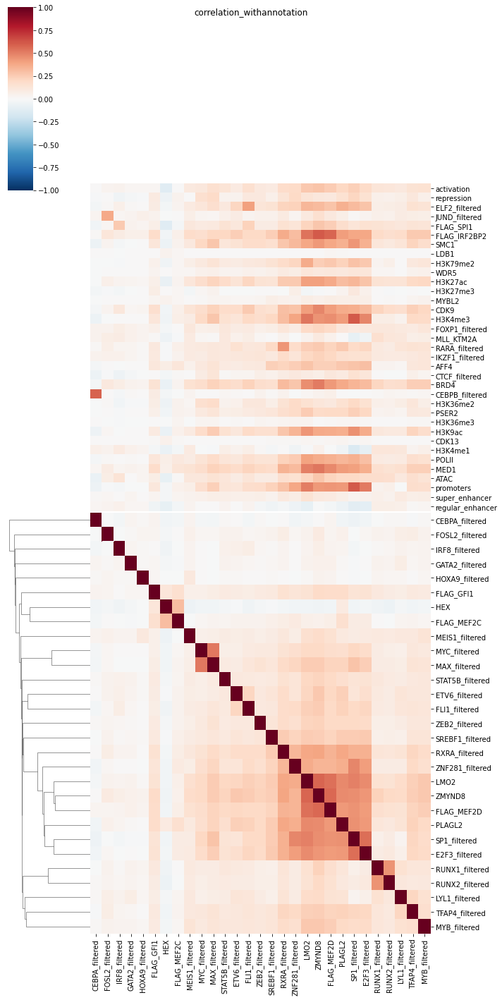

In [42]:
#correlation_withannotation
fig = sns.clustermap(data.iloc[:annot][data.columns[leaves_list(link)]], vmin=-1,vmax=1, col_colors=col.T, figsize=(10,20), cmap='RdBu_r', row_linkage=link, col_cluster=False, colors_ratio=0.01)
fig.ax_col_dendrogram.set_visible(False)
fig.fig.suptitle("correlation_withannotation")
#fig.savefig('../results/'+project+'/plots/'+version+'_'+merging_version+'_'+window+'_correlation_with_annotation.pdf')
fig.savefig('../results/'+project+'/plots/'+version+'_'+merging_version+'_'+window+'_boolcorrelation_with_annotation.pdf')

plt.show()

### binarized

In [43]:
#data = pd.DataFrame(np.corrcoef(stats.zscore(0.01+merged[merged.columns[cols:]].T)), columns=merged.columns[cols:], index = merged.columns[cols:])
data = pd.DataFrame(np.corrcoef(merged[merged.columns[cols:]].T.astype(bool)), columns=merged.columns[cols:], index = merged.columns[cols:])
link = linkage(data[:annot-cols])
col = data.iloc[annot-cols:]
col = col[[co for co in col.columns if co not in col.index.tolist()]]
rdb = cm.get_cmap('RdBu_r', 256)
for val in col.columns:
    a = [rdb(128+int(v*128)) for v in col[val]]
    col[val] = a

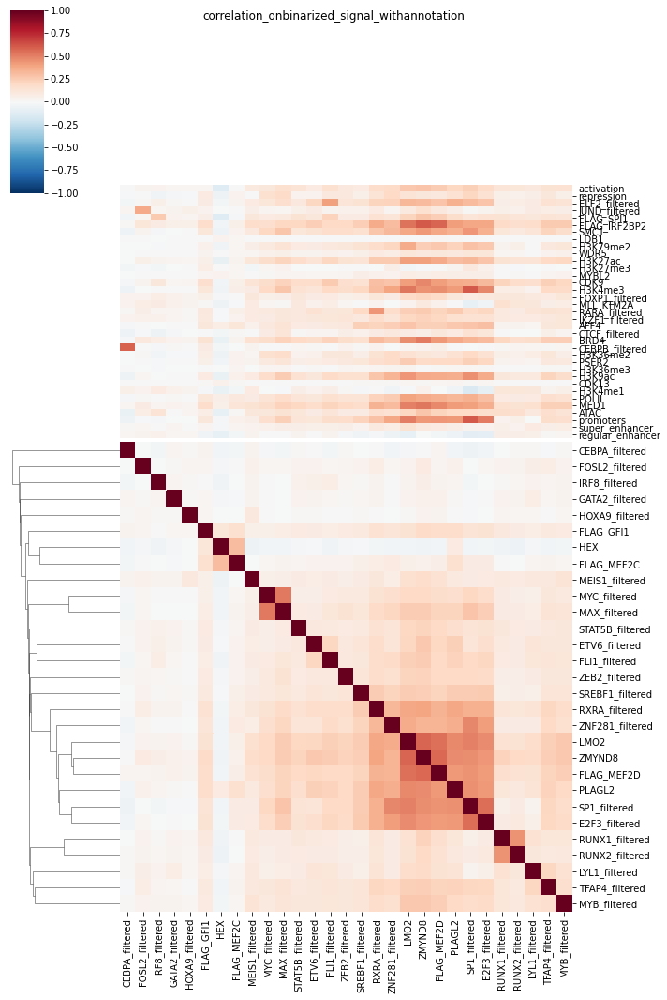

In [44]:
#correlation_withannotation
fig = sns.clustermap(data.iloc[:annot][data.columns[leaves_list(link)]], vmin=-1,vmax=1, col_colors=col.T, figsize=(10,15), cmap='RdBu_r', row_linkage=link, col_cluster=False, colors_ratio=0.008)
fig.ax_col_dendrogram.set_visible(False)
fig.fig.suptitle("correlation_onbinarized_signal_withannotation")
#fig.savefig('../results/'+project+'/plots/'+version+'_'+merging_version+'_'+window+'_correlation_with_annotation.pdf')
fig.savefig('../results/'+project+'/plots/'+version+'_'+merging_version+'_'+window+'_boolcorrelation_onbinarized_signal_with_annotation.pdf')

plt.show()

## Looking at peak overlap 

How many of peak in A (column) overlaps with peak in B (rows)

in other words:

what is the percentage of B's peaks that are overlaped by A's peaks 

In [163]:
overlap, correlation = chip.pairwiseOverlap(merged, norm=True)
enrichment, pvals = chip.enrichment(merged)

we will be correcting for fully similar lines/ columns by removing 1 on their last value


/home/jeremie/.local/lib/python3.8/site-packages/scipy/stats/stats.py:2419: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/home/jeremie/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/jeremie/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/home/jeremie/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2526: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar)
/home/jeremie/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2455: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)
/home/jeremie/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2455: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/home/jeremie/.local/li

In [46]:
#saving the enrichments
overlap.to_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'pairwise_overlap.csv')
correlation.to_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'pairwise_correlation_on_overlap.csv')
enrichment.to_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'pairwise_enrichment_on_overlap.csv')
pvals.to_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'pairwise_enrichment_on_overlap_pvals.csv')

In [ ]:
overlap = pd.read_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'pairwise_overlap.csv', index_col=0)
correlation = pd.read_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'pairwise_correlation_on_overlap.csv', index_col=0)
enrichment = pd.read_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'pairwise_enrichment_on_overlap.csv', index_col=0)
pvals = pd.read_csv('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'pairwise_enrichment_on_overlap_pvals.csv', index_col=0)

### pairwise overlap

In [47]:
data = pd.DataFrame(data=overlap,index=merged.columns[cols:], columns=merged.columns[cols:])
link = linkage(data.iloc[:annot-cols]) # D being the measurement
c = data[[co for co in data.columns if co not in data.iloc[:annot-cols].index.tolist()]]
viridis = cm.get_cmap('viridis', 256)
for val in c.columns:
    a = [viridis(int(v*255)) for v in c[val]]
    c[val] = a

<ipython-input-47-a4be739a8716>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c[val] = a


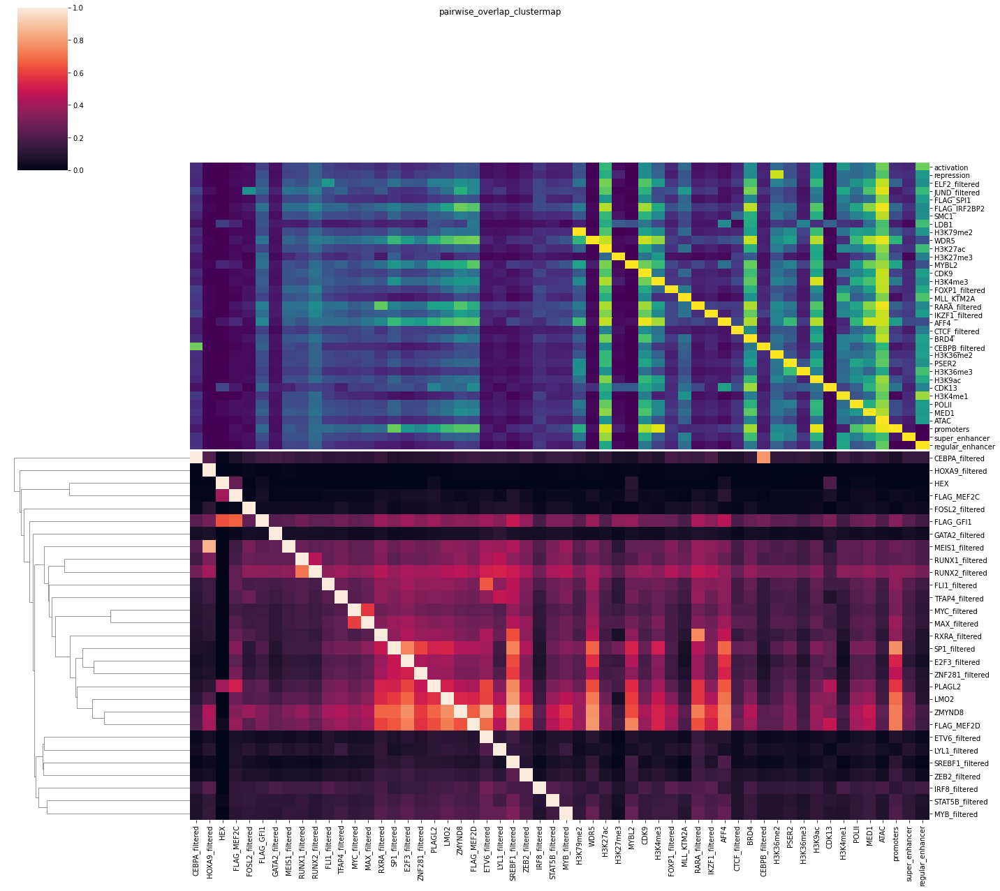

In [48]:
fig = sns.clustermap(data.iloc[:annot-cols][data.columns[np.concatenate((leaves_list(link), range(annot,len(data.columns))))]], row_linkage=link, col_colors=c,figsize=(20,18), colors_ratio=0.01, col_cluster=False)
fig.ax_col_dendrogram.set_visible(False)
fig.fig.suptitle("pairwise_overlap_clustermap")
fig.savefig('../results/'+project+'/plots/'+version+'_'+merging_version+'_'+window+'pairwise_overlap_clustermap.pdf')
plt.show()

### Correlation on overlaps 

on the overlaps given above

In [164]:
data = pd.DataFrame(data = correlation, index = merged.columns[cols:], columns = merged.columns[cols:])
link = linkage(data.iloc[:annot-cols], optimal_ordering=True) # D being the measurement
c = data[[co for co in data.columns if co not in data.iloc[:annot-cols].index.tolist()]]
viridis = cm.get_cmap('viridis', 256)
for val in c.columns:
    a = [rdb(128+int(v*128)) for v in c[val]]
    c[val] = a

<ipython-input-164-63360ec74203>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  c[val] = a


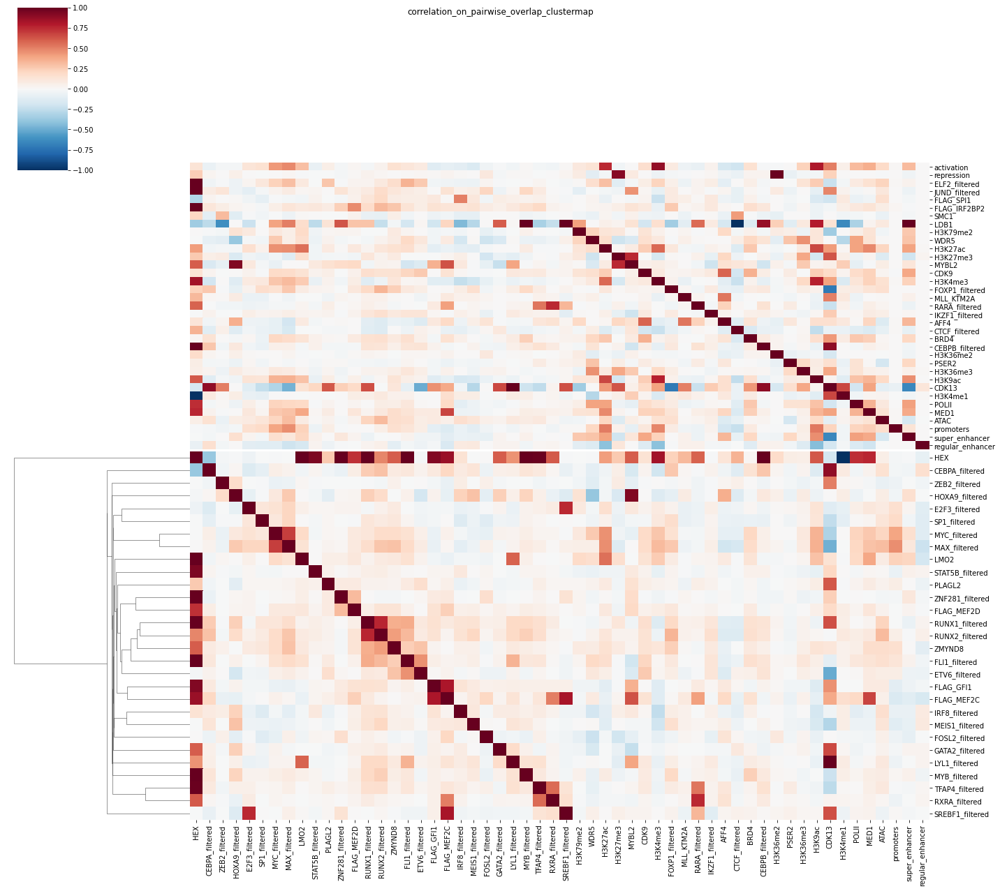

In [165]:
fig = sns.clustermap(data.iloc[:annot-cols][data.columns[np.concatenate((leaves_list(link), range(annot,len(data.columns))))]], row_linkage=link, col_colors=c, colors_ratio=0.01, figsize=(20,18), vmin=-1, vmax=1, cmap='RdBu_r', col_cluster=False)
fig.ax_col_dendrogram.set_visible(False)
fig.fig.suptitle("correlation_on_pairwise_overlap_clustermap")
fig.savefig('../results/'+project+'/plots/'+version+'_'+merging_version+'_'+window+'_correlation_onoverlap.pdf')
plt.show()

### Enrichment

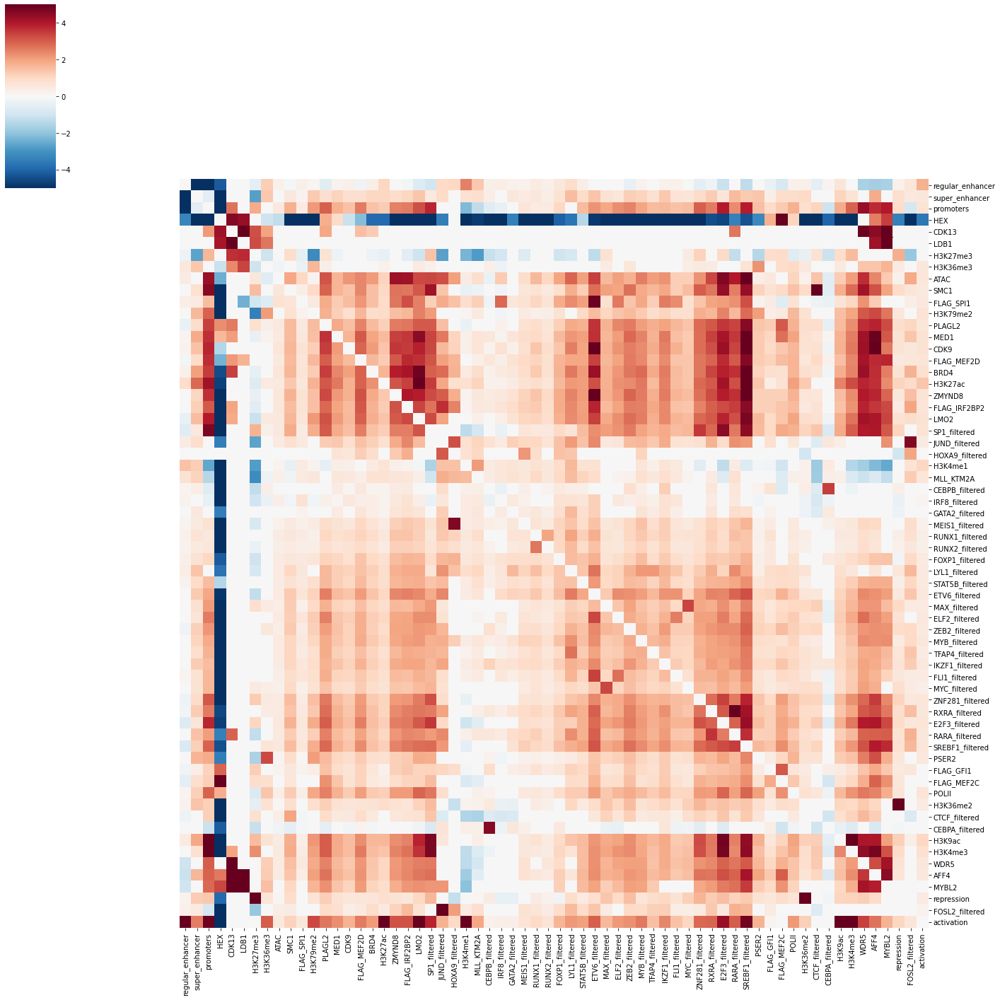

In [166]:
link = linkage(enrichment, optimal_ordering=True)
fig = sns.clustermap(enrichment,figsize=(20,20), vmin=-5,vmax=5, cmap='RdBu_r', col_linkage=link, row_linkage=link)
fig.ax_col_dendrogram.set_visible(False)
fig.ax_row_dendrogram.set_visible(False)
fig.savefig('../results/'+project+'/plots/'+version+'_'+merging_version+'_'+window+'_enrichment_clustermap_all_to_all.pdf')
plt.show()

In [173]:
a = np.array(enrichment)
a[a<-4] = -4
a[a >4] = 4
a = a / a.max()

In [176]:
enrichment.loc['HEX'].min()

-1000.0

In [177]:
link = linkage(enrichment, optimal_ordering=True)
plot.correlationMatrix(enrichment.loc[enrichment.columns[leaves_list(link)]][enrichment.columns[leaves_list(link)]].values, dataIsCorr=True, names=enrichment.columns[leaves_list(link)].tolist(), pvals=pvals[enrichment.columns[leaves_list(link)]].loc[enrichment.columns[leaves_list(link)]].values, size=12, title= version + '_' + merging_version + '_' + window + 'enrichment', folder='../results/'+project+'/plots/',interactive=True,minval=-4,maxval=4)

we are assuming you want to display the pvals of your correlation with size
1000.0


/home/jeremie/.local/lib/python3.8/site-packages/bokeh/io/saving.py:125: UserWarning: save() called but no resources were supplied and output_file(...) was never called, defaulting to resources.CDN
  warn("save() called but no resources were supplied and output_file(...) was never called, defaulting to resources.CDN")
/home/jeremie/.local/lib/python3.8/site-packages/bokeh/io/saving.py:138: UserWarning: save() called but no title was supplied and output_file(...) was never called, using default title 'Bokeh Plot'
  warn("save() called but no title was supplied and output_file(...) was never called, using default title 'Bokeh Plot'")


Figure(id='4061', ...)

### looking only at crcs

In [54]:
enrichment = enrichment[crc].loc[crc]

KeyError: "['STAT5B', 'FLI1', 'MYC', 'RUNX1', 'FOSL2', 'LYL1', 'RXRA', 'IRF8', 'MYB', 'GATA2', 'ZFPM1', 'CEBPA', 'MEF2C', 'ZEB2', 'SREBF1', 'RUNX2', 'MEIS1', 'SP1', 'TFAP4', 'ETV6', 'E2F3', 'ZNF281', 'MAX', 'HOXA9', 'SPI1'] not in index"

In [ ]:
link = linkage(enrichment, optimal_ordering=True)
plot.correlationMatrix(enrichment.loc[enrichment.columns[leaves_list(link)]][enrichment.columns[leaves_list(link)]].values, dataIsCorr=True, names=enrichment.columns[leaves_list(link)].tolist(), pvals=pvals[enrichment.columns[leaves_list(link)]].loc[enrichment.columns[leaves_list(link)]].values, size=12, title= version + '_' + merging_version + '_' + window + 'enrichment', folder='../results/'+project+'/plots/',interactive=True,minval=-4,maxval=4)

## clustering

I have tried gaussian mixtures and Agglomerative clustering algorithm. Only the second can create a hierarchical clustering.

It seems that gaussian mixture makes more sense given the data we have, for now, is more "homogeneous". 

**I am still not so happy with the clustering.** It can be because of the how much importance, outlier values and the high number of noisy values from locations with no peaks.

We can use similar methods to RNAseq to improve this (clamping values, log transform, first round of PCA..)


### using KMeans

In [127]:
data= merged[merged.columns[cols:annot]].values
# using score
#scaled_data = stats.zscore(data)
# using regular scaling
#scaled_data = (data-data.min(0))/(data.max(0)-data.min(0))
# on boolean
scaled_data = data.astype(bool)

In [128]:
#https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans
n = 3
n_clust=[10,20,50,100,300]
kmean = KMeans(n_clusters=n_clust[n],n_jobs=8)
groups = kmean.fit_predict(scaled_data)
centroid = kmean.cluster_centers_

#### plotting center location of clusters (kind of enrichment)

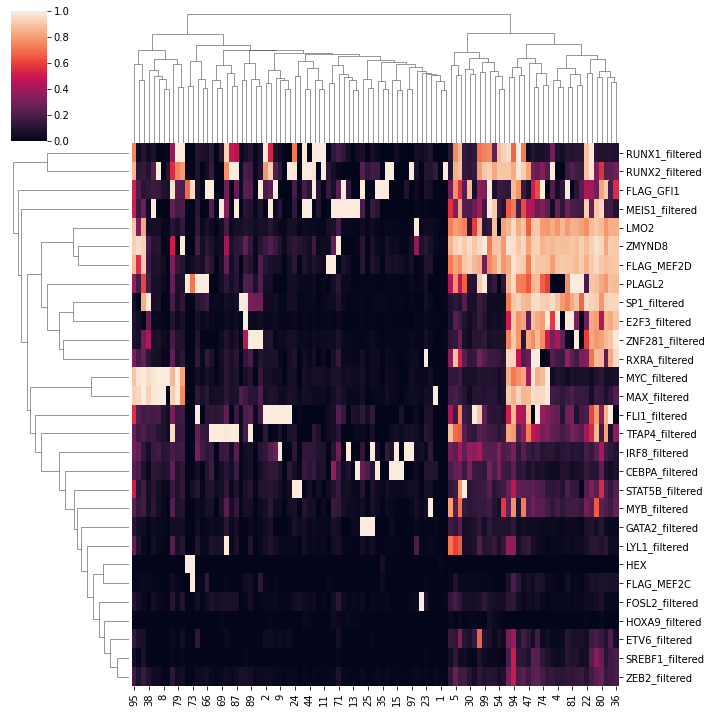

In [132]:
df = pd.DataFrame(centroid,columns=merged.columns[cols:annot]).T
#df = (df.T/df.max(1)).T
fig = sns.clustermap(df, vmax=1)
fig.savefig('../results/'+project+'/plots/'+version+'_'+merging_version+'_'+window+'_kmeans_'+str(n_clust[n])+'_centroids.pdf')

#### showing the cobinding matrix with the clusters

In [61]:
merged = merged.reset_index(drop=True)

In [133]:
rand = np.random.choice(merged.index,5000)

subgroups = groups[rand]
sorting = np.argsort(subgroups)
rainb = cm.get_cmap('gist_rainbow', len(set(groups)))
colors = [rainb(i) for i in subgroups[sorting]]

viridis = cm.get_cmap('viridis', 256)
data = merged[merged.columns[annot:]]
for val in data.columns:
    data[val]=np.log2(1+data[val])
data = (data-data.min())/(data.max()-data.min())
data = data.iloc[rand].iloc[sorting]
for val in data.columns:
    a = [viridis(int(v*256)) for v in data[val]]
    data[val] = a
data["clusters"]  = colors

<ipython-input-133-770781c76b2b>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[val]=np.log2(1+data[val])


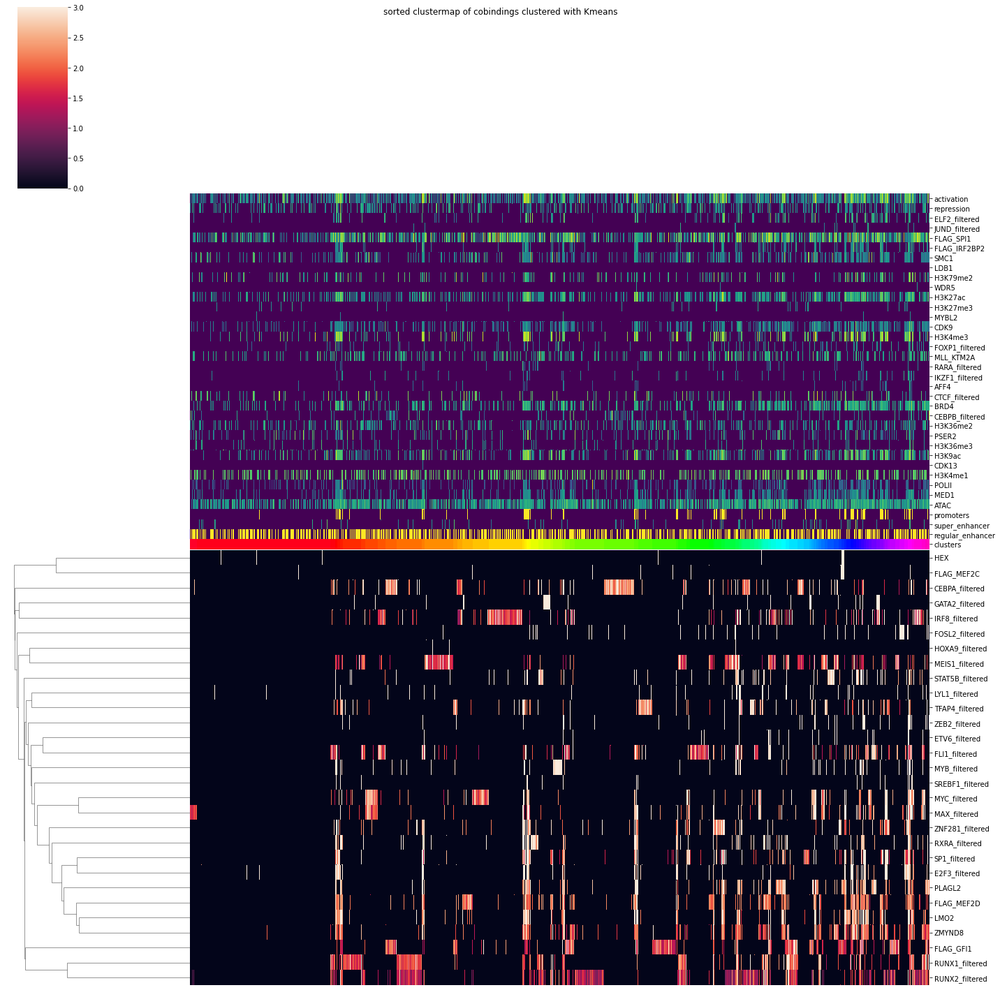

In [134]:
fig = sns.clustermap(np.log2(1.01+merged[merged.columns[cols:annot]].iloc[rand].iloc[sorting].T), vmin=0, vmax=3, figsize=(20,20), z_score=0, colors_ratio=0.01, col_cluster=False,col_colors=data, xticklabels=False)
fig.ax_col_dendrogram.set_visible(False)
fig.fig.suptitle("sorted clustermap of cobindings clustered with Kmeans")
fig.savefig('../results/'+project+'/plots/'+version+'_'+merging_version+'_'+window+'_kmeans_'+str(n_clust[n])+'_clustermap_cobinding.pdf')
plt.show()

#### Computing enrichment on the clusters

In [135]:
enr, pvals, _ = chip.enrichment(merged, groups=groups)

../../JKBio/epigenetics/chipseq.py:1168: RuntimeWarning: divide by zero encountered in log2
  groups), columns=bedfile.columns[bedcol:])


In [151]:
enr.T

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
CEBPA_filtered,0.000000,-1000.000000,0.000000,0.000000,-1.705242,1.159563,-0.961803,0.000000,-0.845100,-0.939110,...,-1000.000000,-1.723314,-5.794724,-2.090532,1.019651,0.954771,0.000000,-1000.000000,0.000000,0.000000
HOXA9_filtered,0.000000,-4.122506,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
PLAGL2,-6.347343,-1000.000000,-0.958832,5.965966,-1000.000000,4.688965,-4.939282,0.000000,-1.895136,-1000.000000,...,-3.271117,-2.033941,-2.914383,1.074301,7.305541,2.305021,4.323771,-2.248664,0.000000,1000.000000
MEIS1_filtered,-1000.000000,-1000.000000,-1000.000000,5.309198,0.000000,1.022446,-1.108212,1000.000000,-1000.000000,-0.917346,...,-1000.000000,1000.000000,-1000.000000,-1.064733,3.491364,2.181515,2.863559,-1000.000000,0.000000,0.000000
ETV6_filtered,-1000.000000,-4.090258,0.000000,3.371984,0.000000,2.672788,-3.888361,0.000000,-5.558478,0.000000,...,0.000000,0.000000,0.000000,0.000000,4.843217,2.818889,3.182407,0.000000,0.000000,2.157401
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MED1,-1.006313,-1.898972,0.000000,7.988040,4.898286,5.879819,-1.191132,1.004608,-0.894451,-0.797759,...,-0.897910,-0.779198,-0.731241,2.209024,9.001715,5.069654,6.497796,-1.182548,1.731267,3.350293
ATAC,0.000000,-1.111151,1.486820,7.483413,6.533686,1000.000000,0.000000,2.016122,0.000000,0.755964,...,0.000000,0.000000,0.000000,4.248284,1000.000000,4.380951,7.016287,1.460094,3.916441,5.789567
promoters,-2.720739,-3.406673,-1.999696,4.629550,4.737876,0.000000,-3.060017,-1.806206,-1.843455,-2.432357,...,-2.445139,-3.483587,-5.999696,3.469620,4.060621,0.000000,4.407251,-3.806557,0.000000,0.000000
super_enhancer,0.000000,-0.539404,0.000000,0.000000,0.000000,2.417723,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,2.809532,1.658321,0.000000,0.000000,0.000000,0.000000


In [ ]:
TODO: cluuster over columns as well

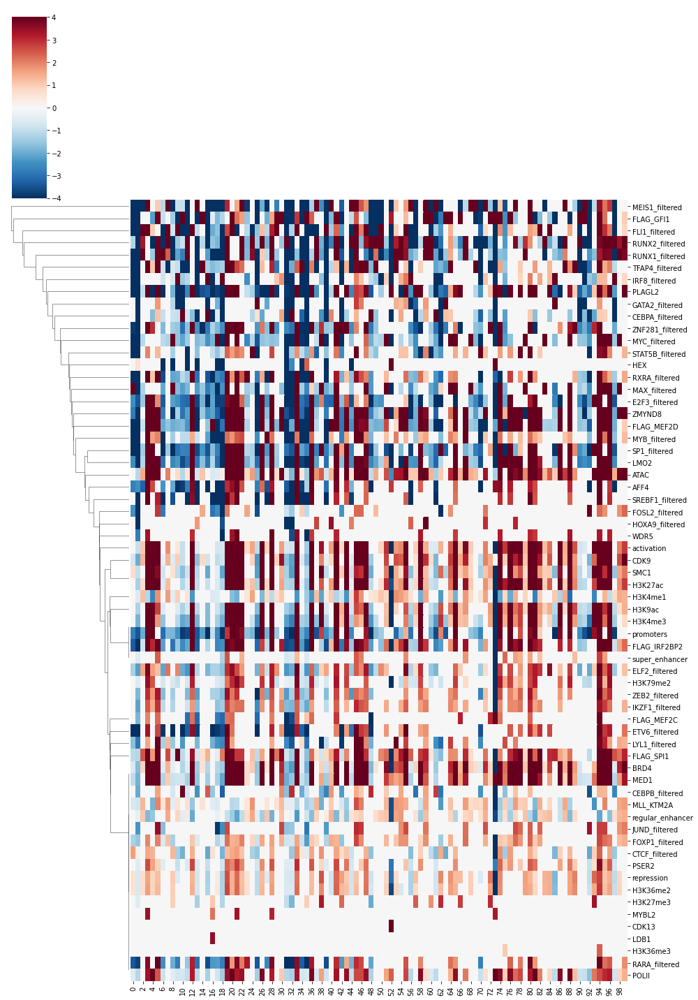

In [136]:
# enrichment for each cluster
fig = sns.clustermap(enr.T,figsize=(14,20), col_cluster=0, vmax=4, vmin=-4, cmap='RdBu_r')
fig.savefig('../results/'+project+'/plots/'+version+'_'+merging_version+'_'+window+'_kmeans_'+str(n_clust[n])+'enrichment_on_cluster_metasubset.pdf')
plt.show()

#### using bokeh

pvalue will be informed by opacity

In [67]:
fig = plot.correlationMatrix(enr.loc[enr.columns[leaves_list(link)]][enr.columns[leaves_list(link)]].values, maxokpval=10**-9,  pvals= pvals[enr.columns[leaves_list(link)]].loc[enr.columns[leaves_list(link)]], names=enr.columns[leaves_list(link)].tolist(), size=12, title= version + '_' + merging_version + '_' + window + 'enrichment', folder='../results/'+project+'/plots/', interactive=True, minval=-4, maxval=4, dataIsCorr=True)

KeyError: "None of [Index(['regular_enhancer', 'FOSL2_filtered', 'HOXA9_filtered',\n       'super_enhancer', 'promoters', 'HEX', 'MYBL2', 'AFF4', 'H3K36me3',\n       'JUND_filtered', 'ATAC', 'H3K4me3', 'POLII', 'FLAG_GFI1', 'H3K36me2',\n       'H3K4me1', 'MLL_KTM2A', 'GATA2_filtered', 'IRF8_filtered',\n       'CEBPB_filtered', 'LYL1_filtered', 'MEIS1_filtered', 'RUNX1_filtered',\n       'RUNX2_filtered', 'FOXP1_filtered', 'STAT5B_filtered', 'MYC_filtered',\n       'FLI1_filtered', 'TFAP4_filtered', 'MYB_filtered', 'IKZF1_filtered',\n       'ZEB2_filtered', 'ELF2_filtered', 'MAX_filtered', 'ZNF281_filtered',\n       'ETV6_filtered', 'RARA_filtered', 'RXRA_filtered', 'E2F3_filtered',\n       'SP1_filtered', 'H3K79me2', 'PSER2', 'LMO2', 'FLAG_IRF2BP2', 'ZMYND8',\n       'H3K27ac', 'BRD4', 'FLAG_MEF2D', 'CDK9', 'MED1', 'PLAGL2',\n       'SREBF1_filtered', 'FLAG_SPI1', 'CEBPA_filtered', 'CTCF_filtered',\n       'FLAG_MEF2C', 'SMC1', 'H3K9ac', 'H3K27me3', 'repression', 'WDR5',\n       'activation', 'CDK13', 'LDB1'],\n      dtype='object')] are in the [index]"

#### showing enrichment over cobinding

In [ ]:
TODO: why does the leftmost cluster seem devoid of peaks?

In [152]:
TODO: also cluster over columns for this one.

SyntaxError: invalid syntax (<ipython-input-152-744acc3b8a05>, line 1)

../../JKBio/epigenetics/chipseq.py:1168: RuntimeWarning: divide by zero encountered in log2
  groups), columns=bedfile.columns[bedcol:])
../../JKBio/utils/plot.py:626: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  redblue = cm.get_cmap('RdBu_r',256)
/home/jeremie/.local/lib/python3.8/site-packages/pandas/core/frame.py:2986: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._where(-key, value, inplace=True)
../../JKBio/utils/plot.py:627: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_inde

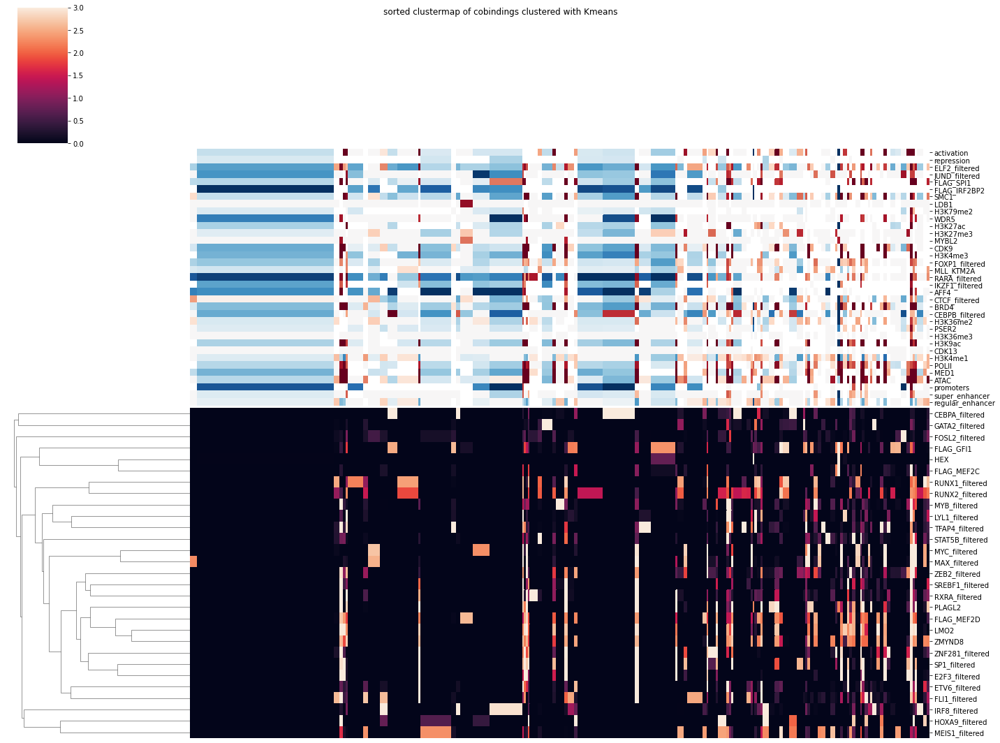

In [137]:
plot.andrew(groups, merged, annot, cols=8, precise=False, folder = '../results/' + project + '/plots/' + version + '_' + merging_version + '_' + window + '_kmeans_', title = "sorted clustermap of cobindings clustered with Kmeans")

## Using SOMs

In [140]:
#Import the library
size = 20
#Build a network 20x20 with a weights format taken from the raw_data and activate Periodic Boundary Conditions. 
net = sps.somNet(size,size, scaled_data, PBC=True)

#Train the network for 10000 epochs and with initial learning rate of 0.01. 
net.train(0.01, 10000)

#Save the weights to file
net.save('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'_cobinding_SOMweights_'+str(size))

Periodic Boundary Conditions active.
The weights will be initialised randomly.
Training SOM... done!


In [712]:
net = sps.somNet(0,0, scaled_data, loadFile='../results/'+project+'/'+version+'_'+merging_version+'_'+window+'_cobinding_SOMweights_'+str(size), PBC=True)

Periodic Boundary Conditions active.
The weights will be loaded from file.


In [141]:
pathplot = "../results/"+project+'/plots/'+version+'_'+merging_version+'_'+window+"_somNets/"
! mkdir $pathplot

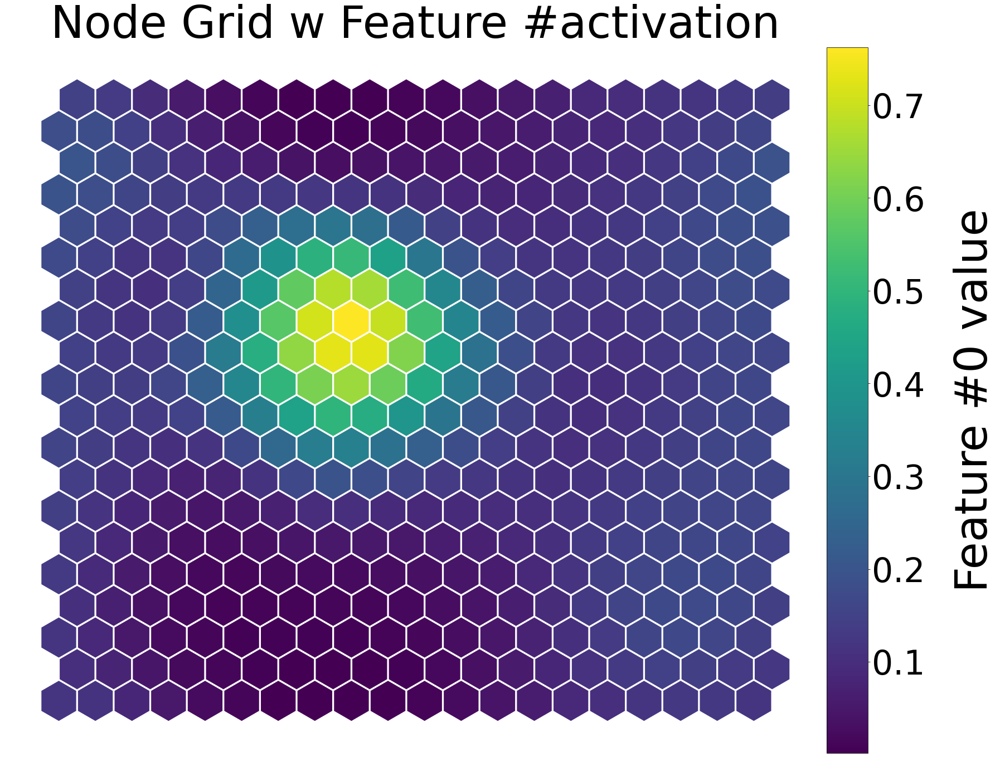

<Figure size 432x288 with 0 Axes>

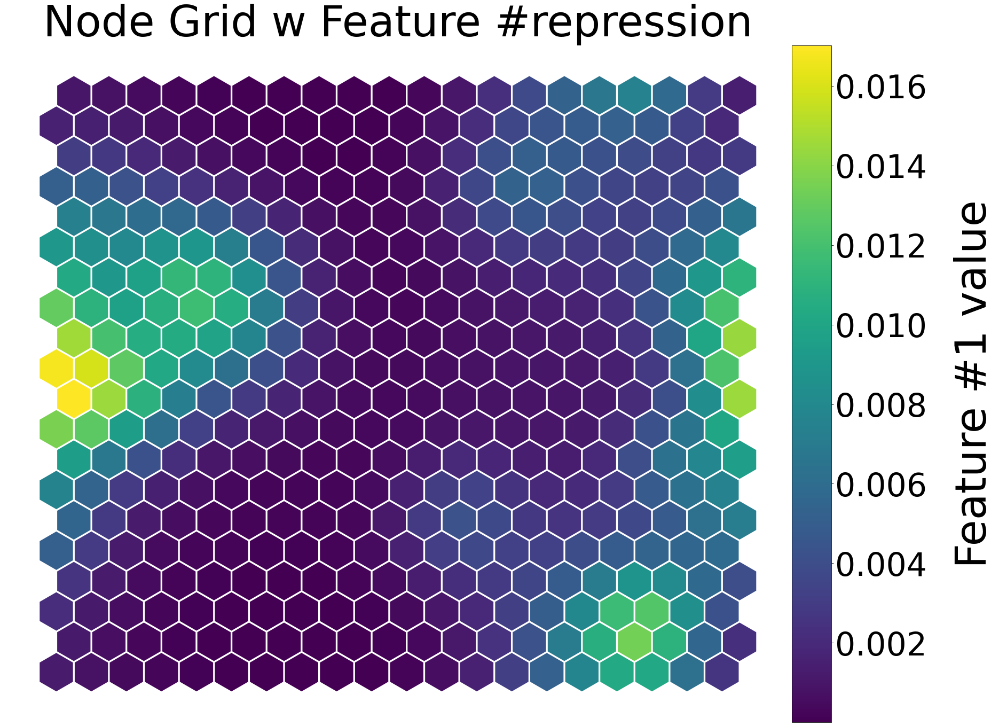

<Figure size 432x288 with 0 Axes>

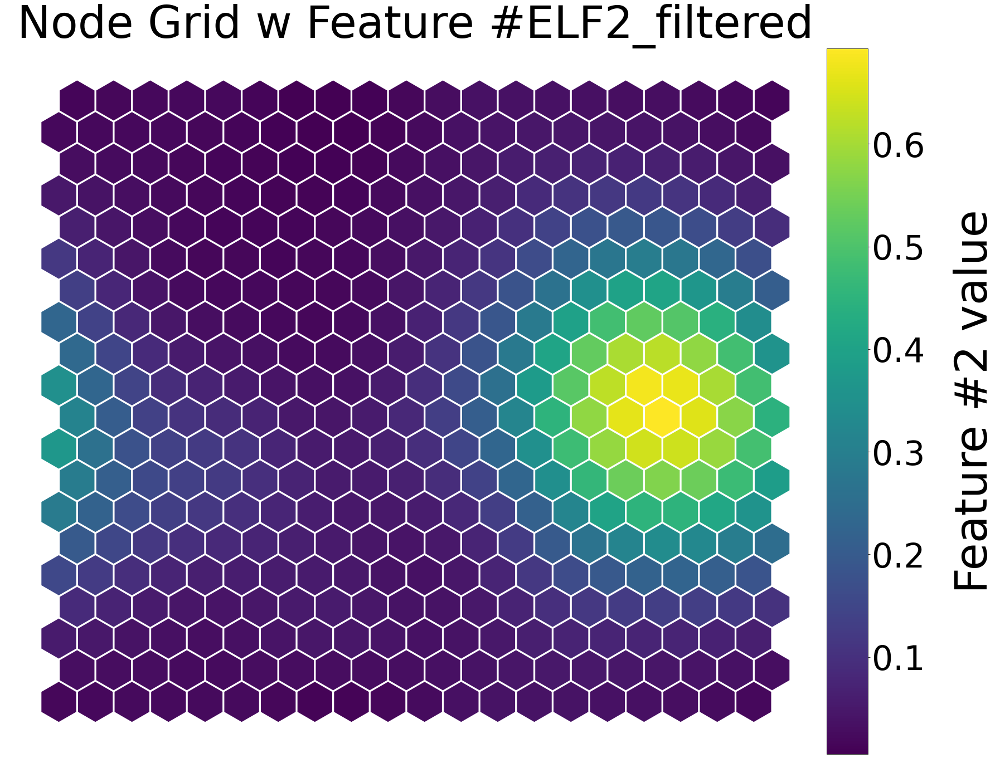

<Figure size 432x288 with 0 Axes>

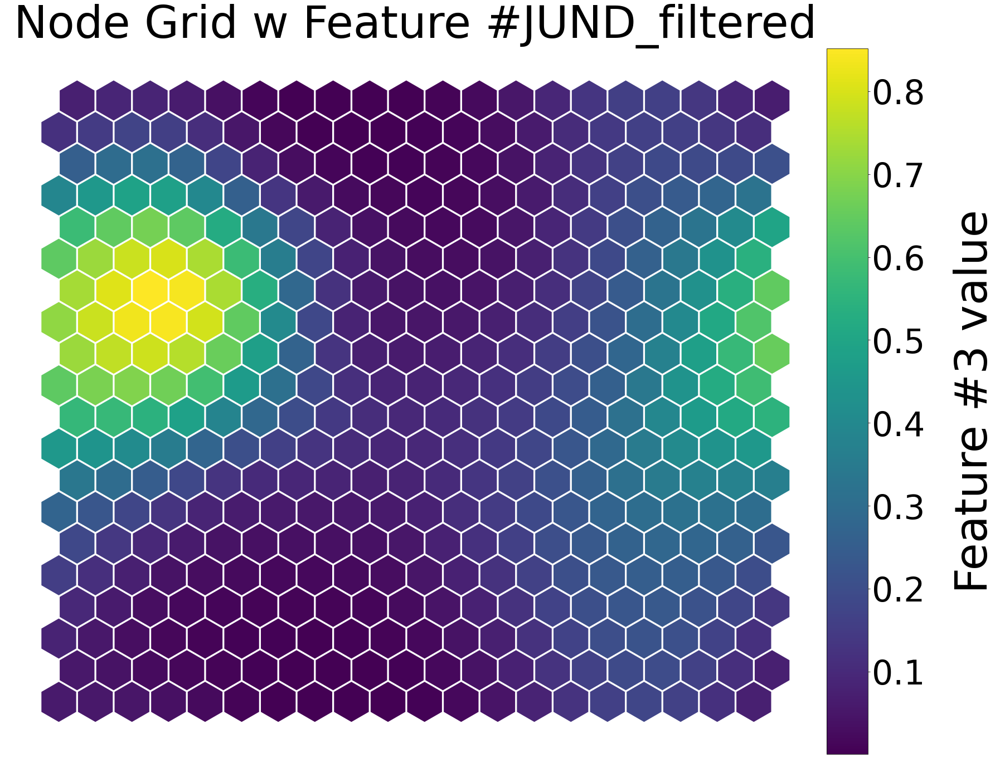

<Figure size 432x288 with 0 Axes>

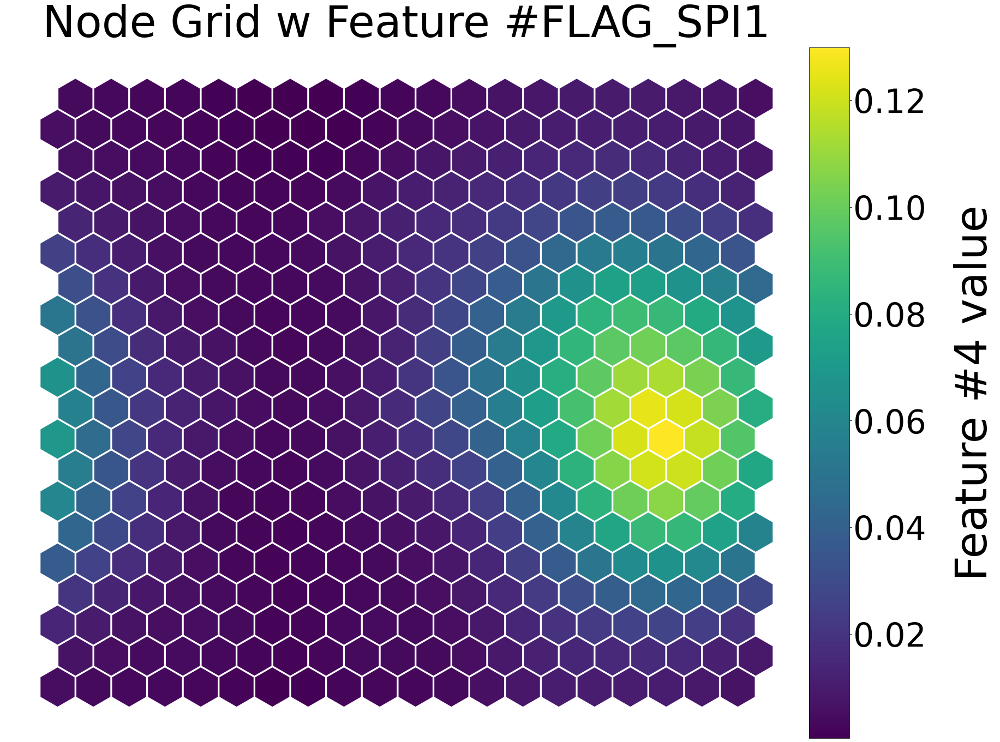

<Figure size 432x288 with 0 Axes>

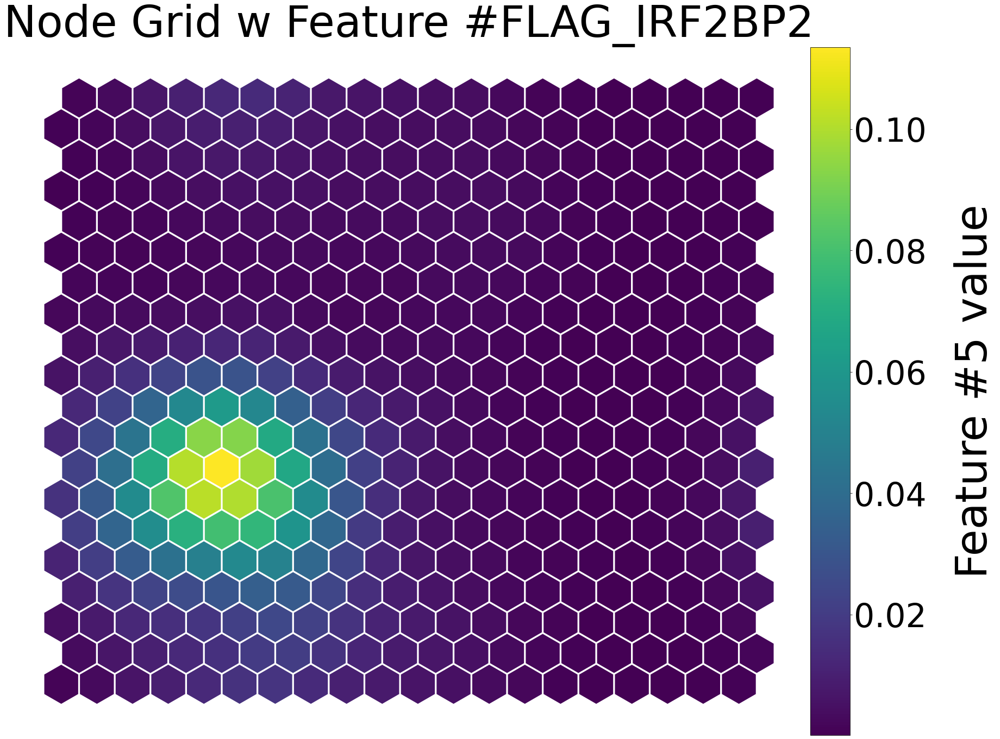

<Figure size 432x288 with 0 Axes>

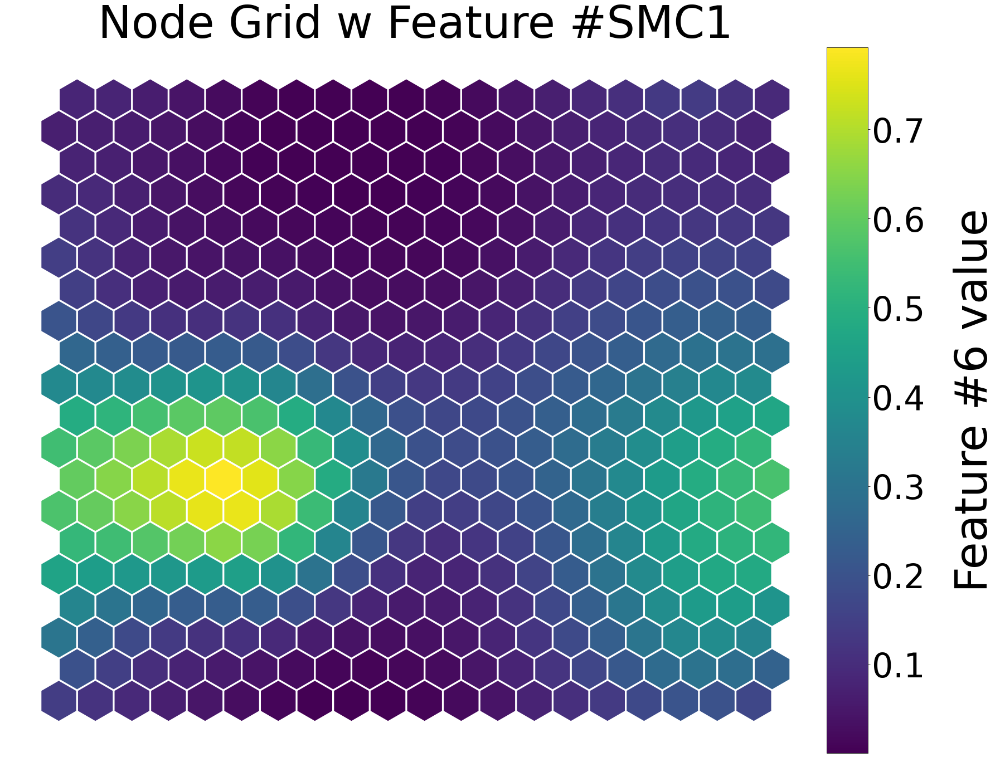

<Figure size 432x288 with 0 Axes>

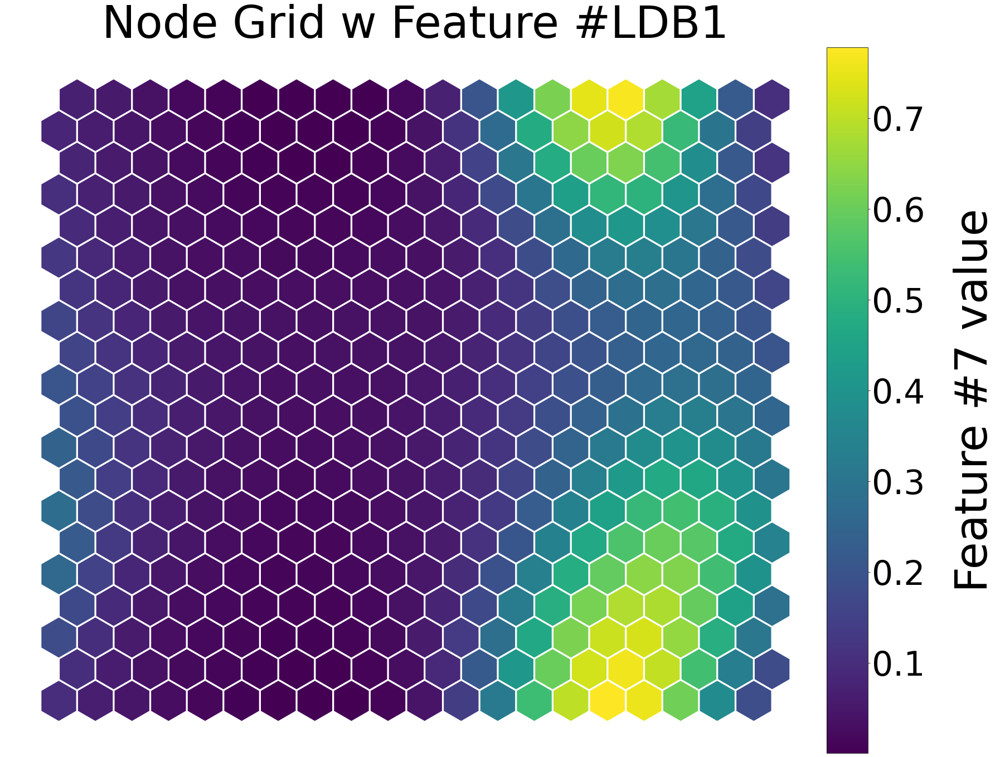

<Figure size 432x288 with 0 Axes>

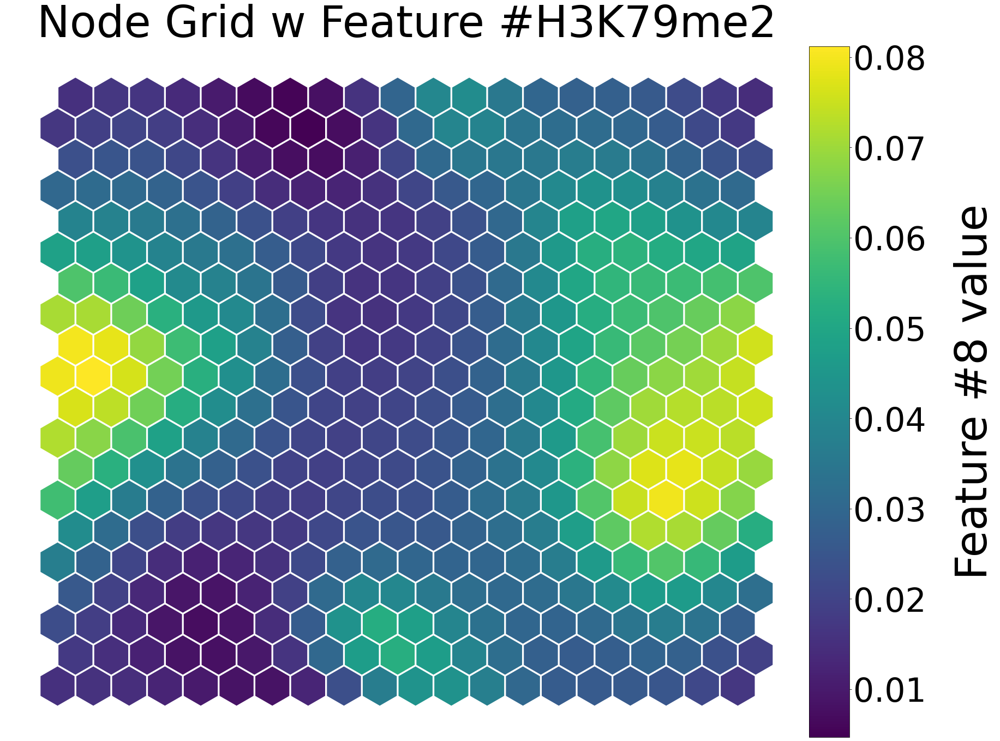

<Figure size 432x288 with 0 Axes>

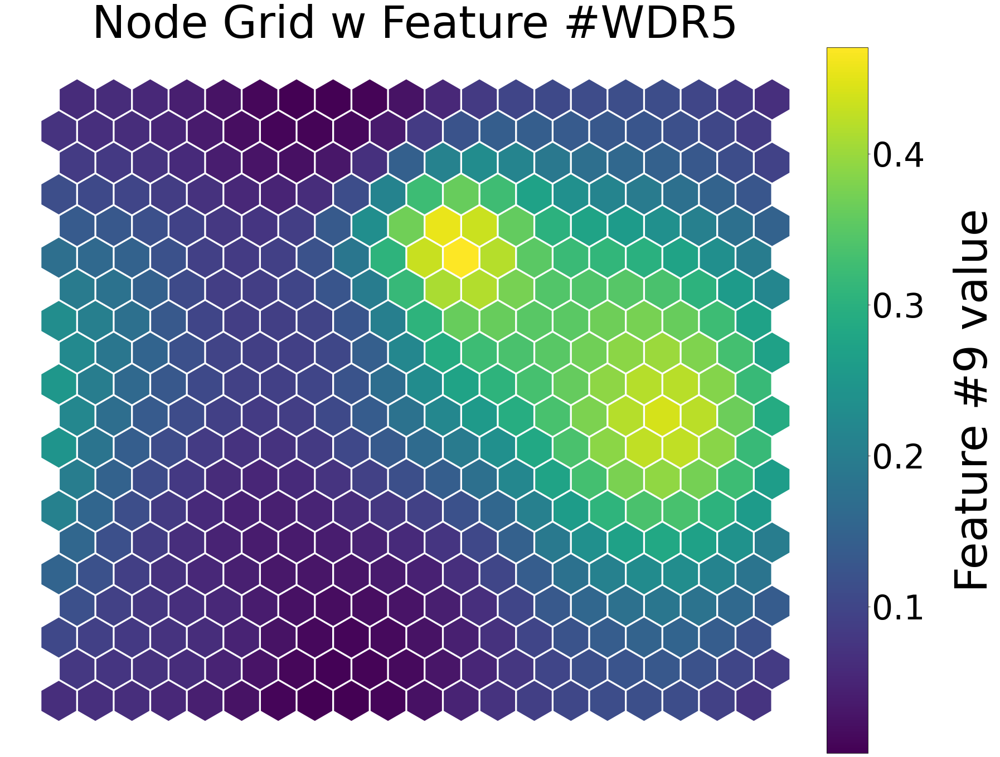

<Figure size 432x288 with 0 Axes>

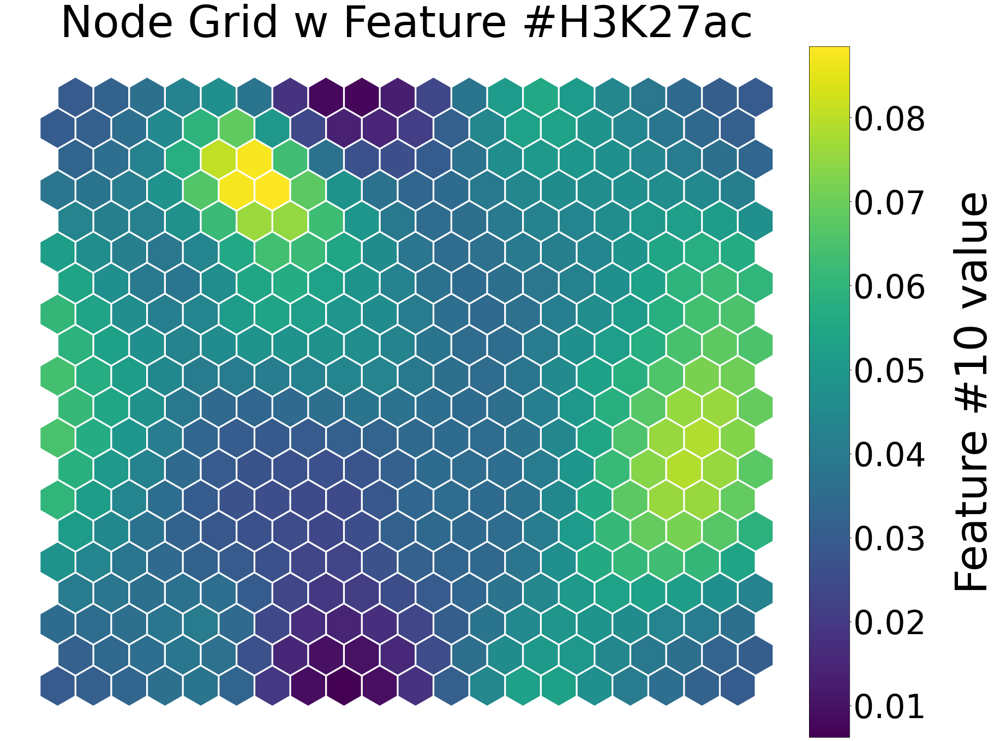

<Figure size 432x288 with 0 Axes>

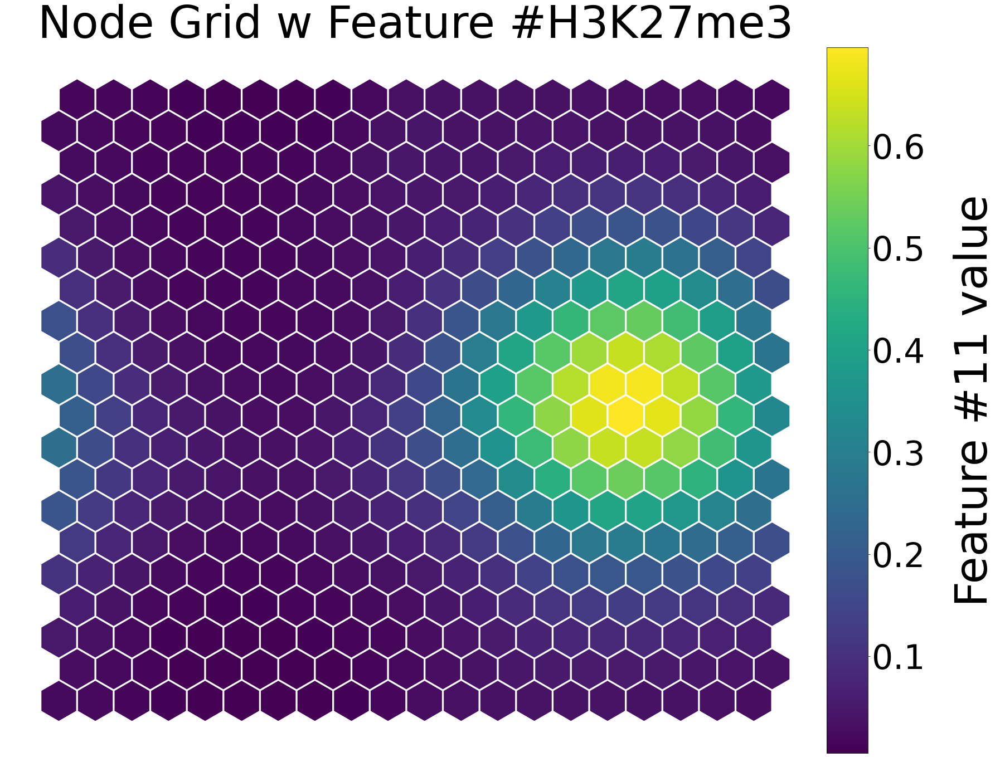

<Figure size 432x288 with 0 Axes>

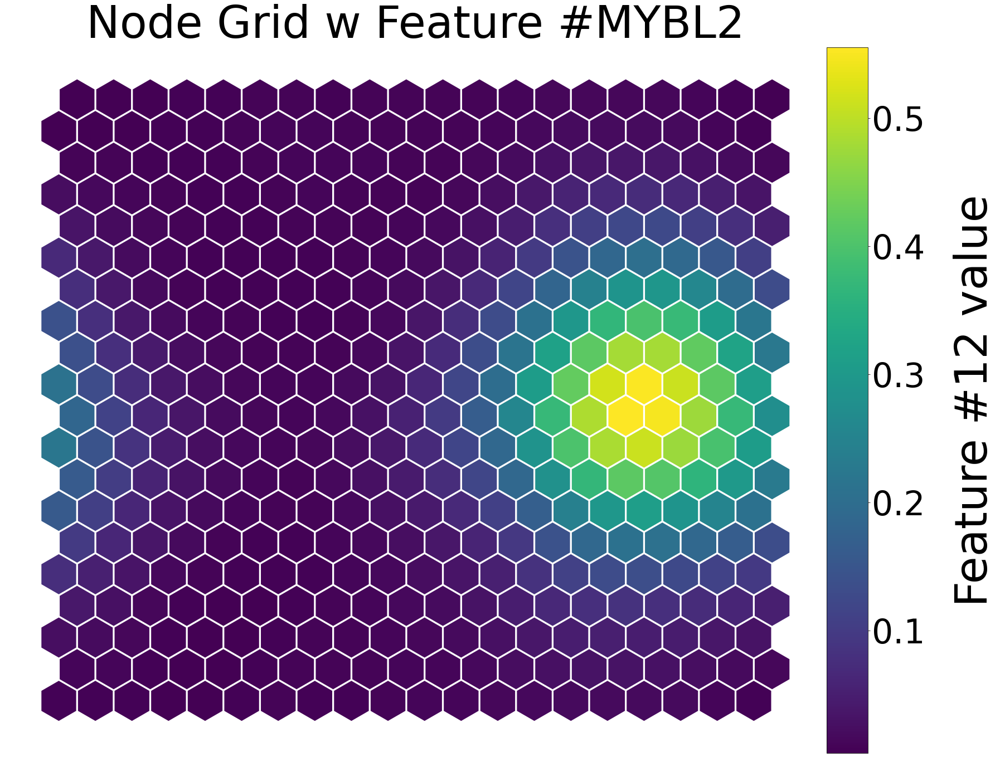

<Figure size 432x288 with 0 Axes>

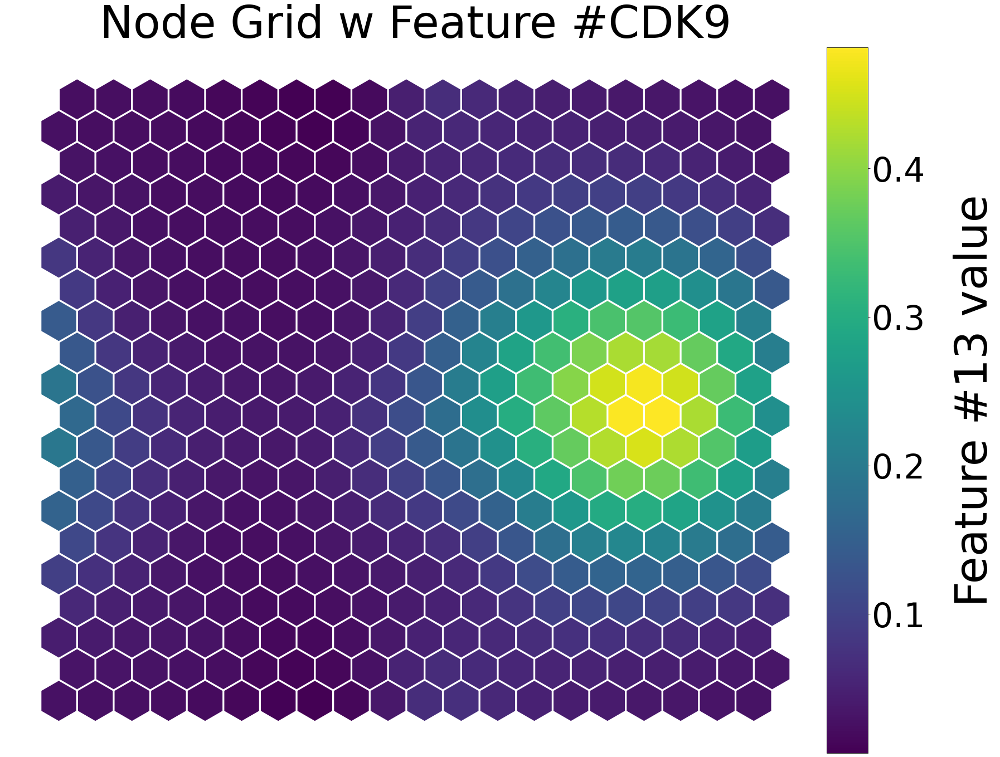

<Figure size 432x288 with 0 Axes>

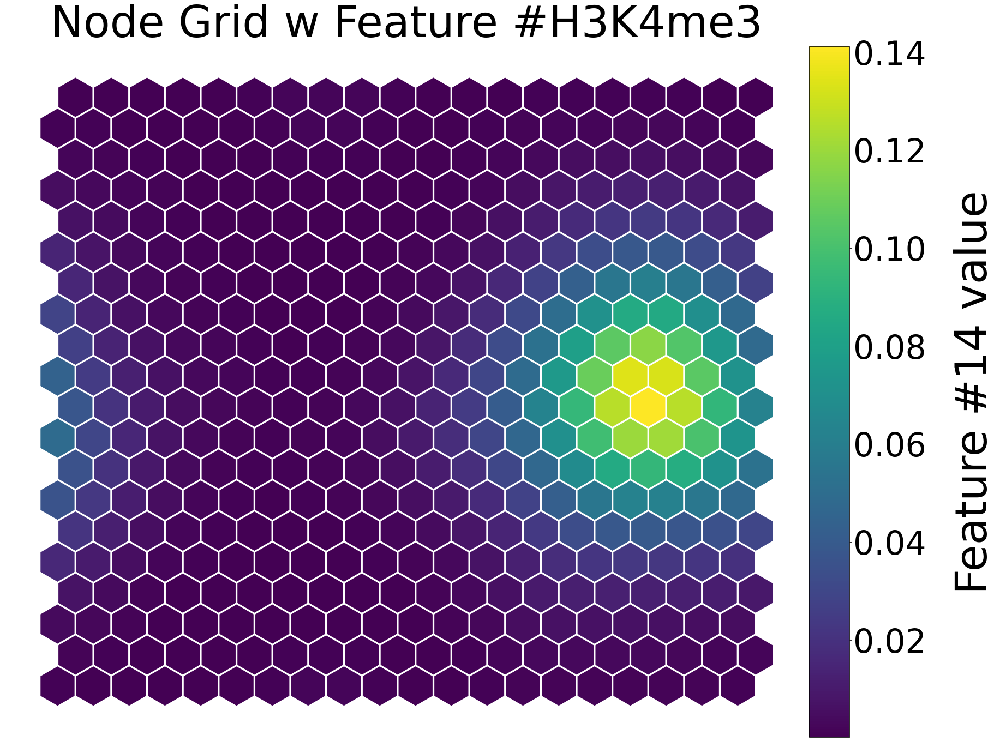

<Figure size 432x288 with 0 Axes>

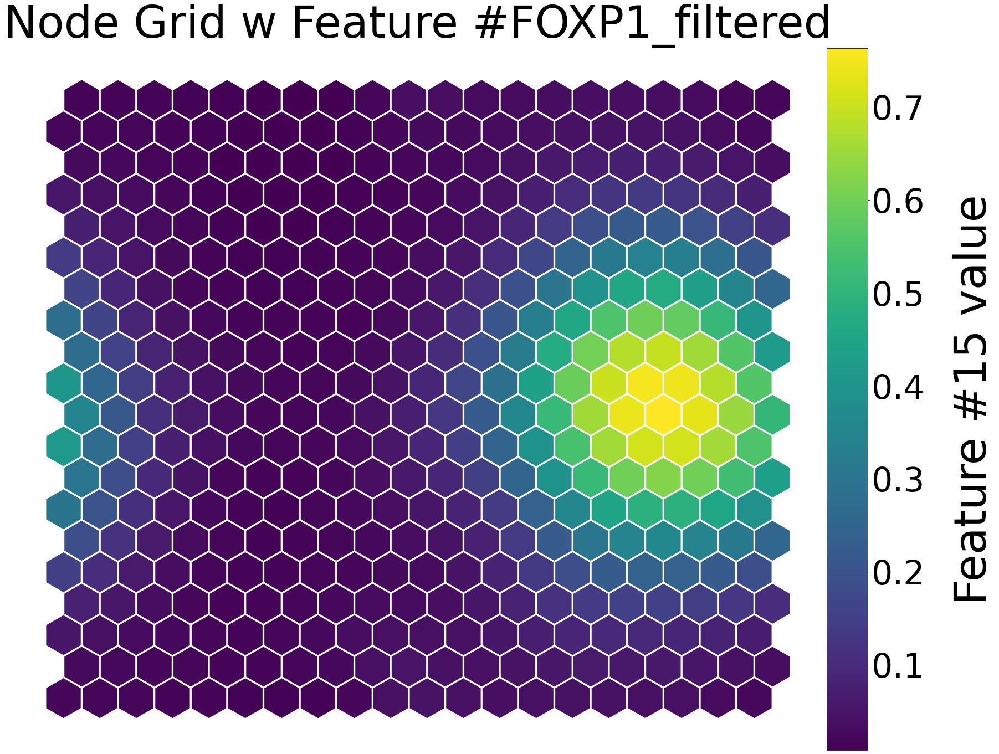

<Figure size 432x288 with 0 Axes>

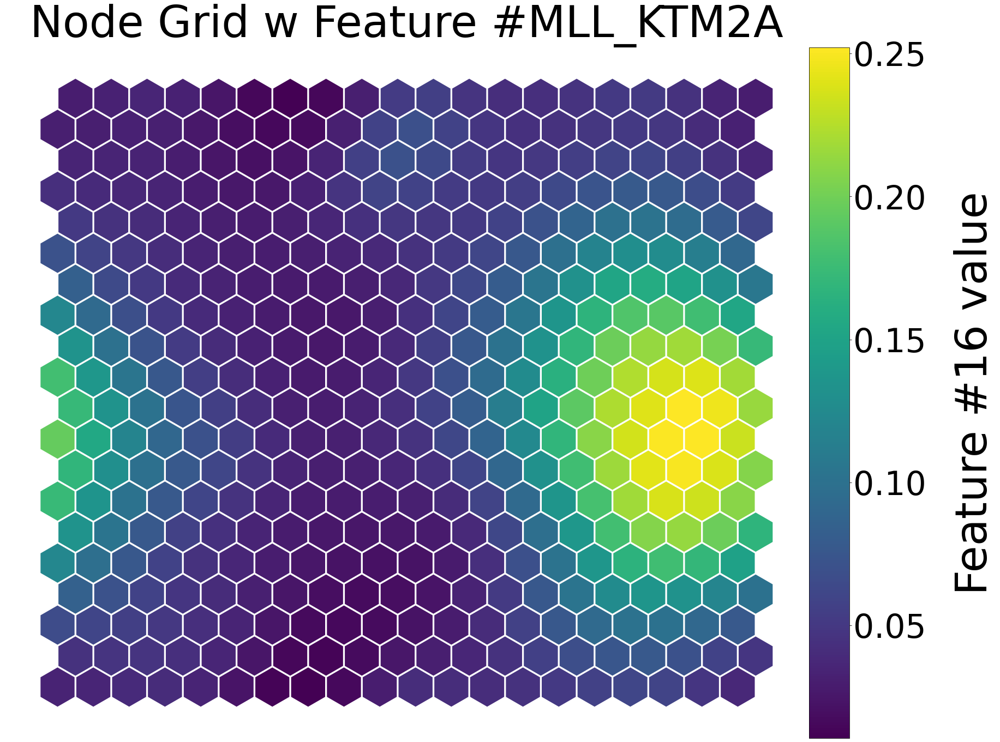

<Figure size 432x288 with 0 Axes>

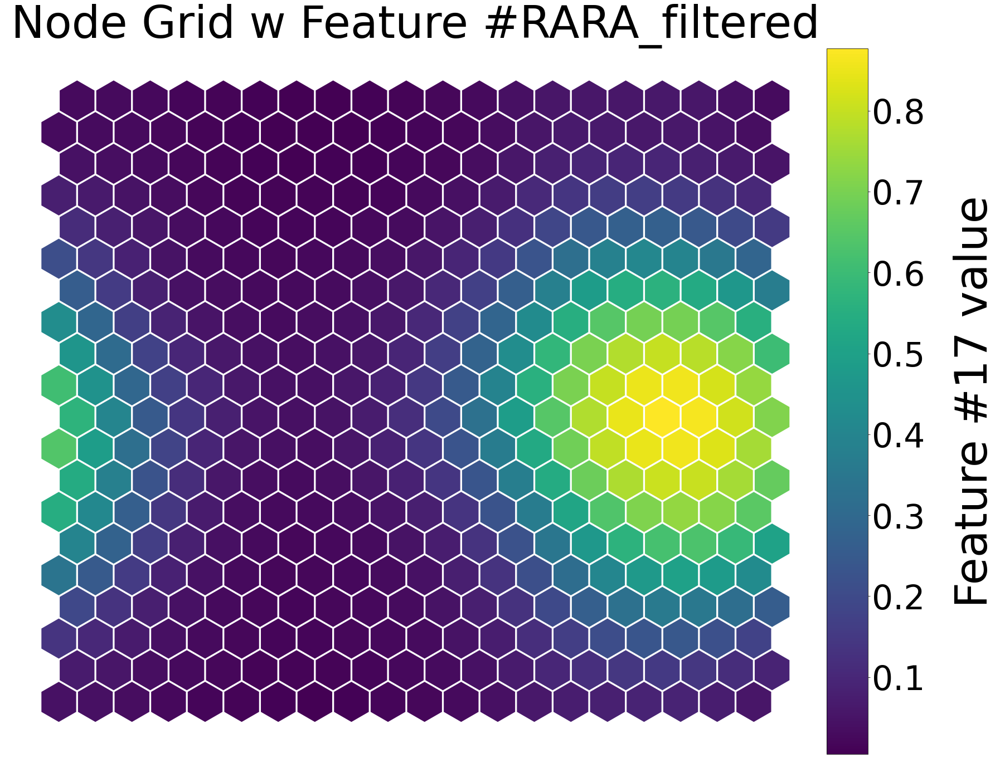

<Figure size 432x288 with 0 Axes>

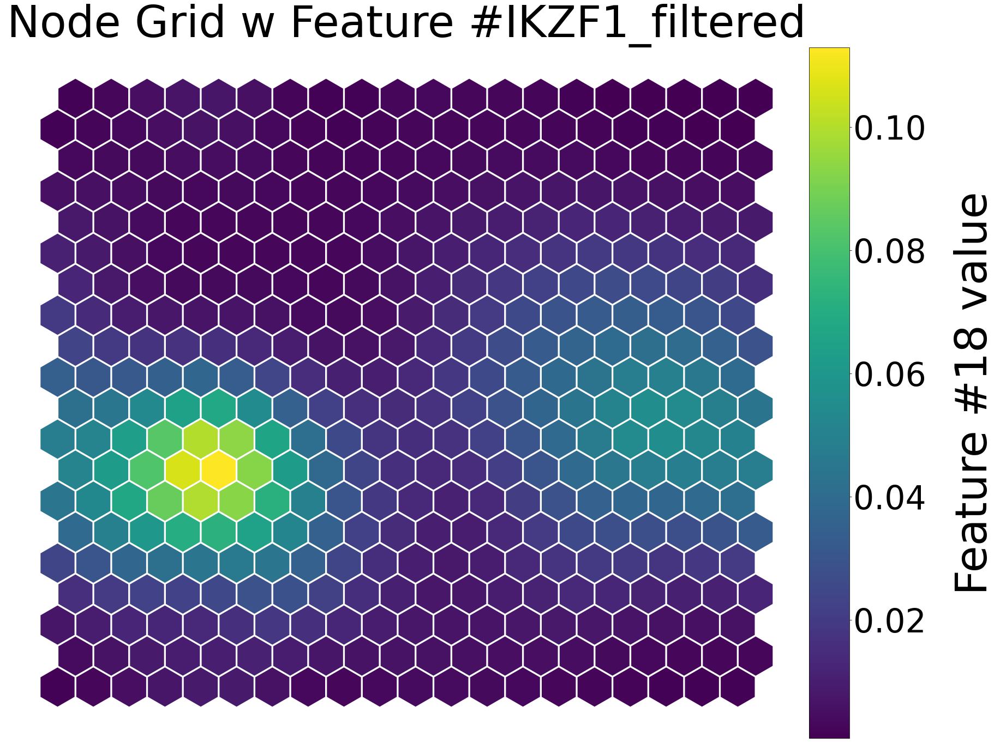

<Figure size 432x288 with 0 Axes>

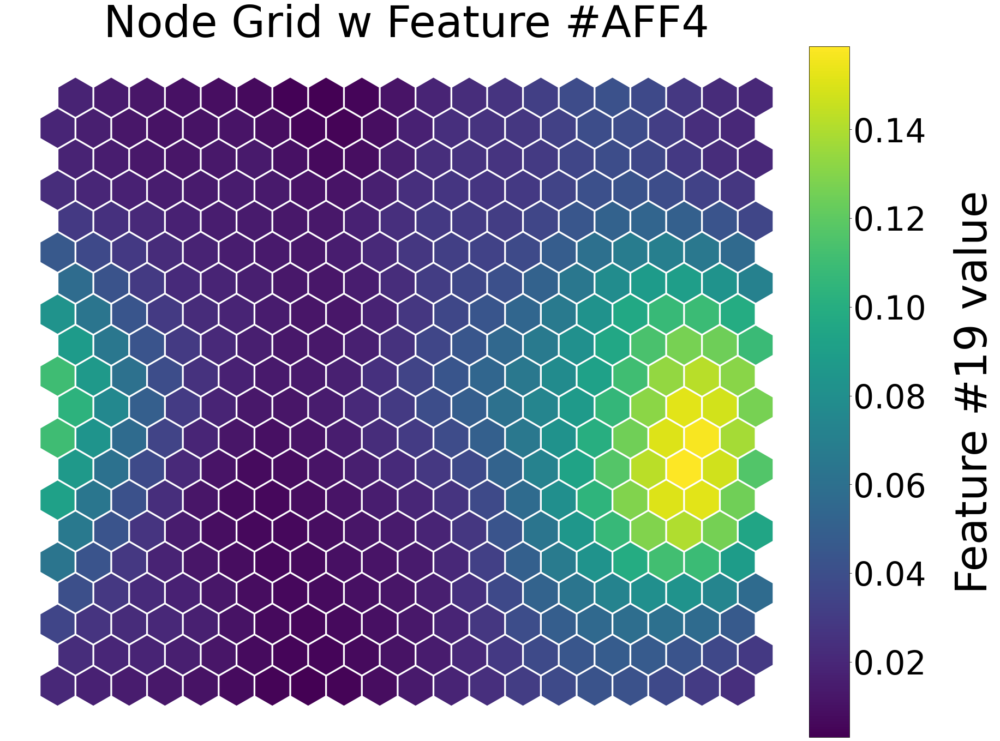

<Figure size 432x288 with 0 Axes>

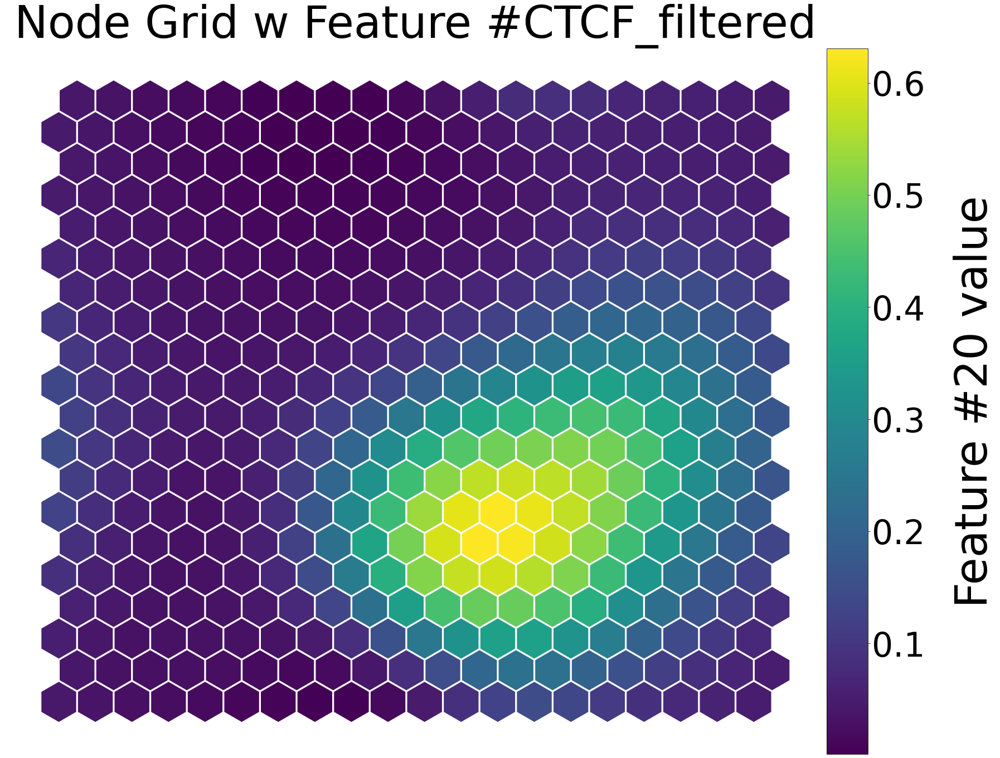

<Figure size 432x288 with 0 Axes>

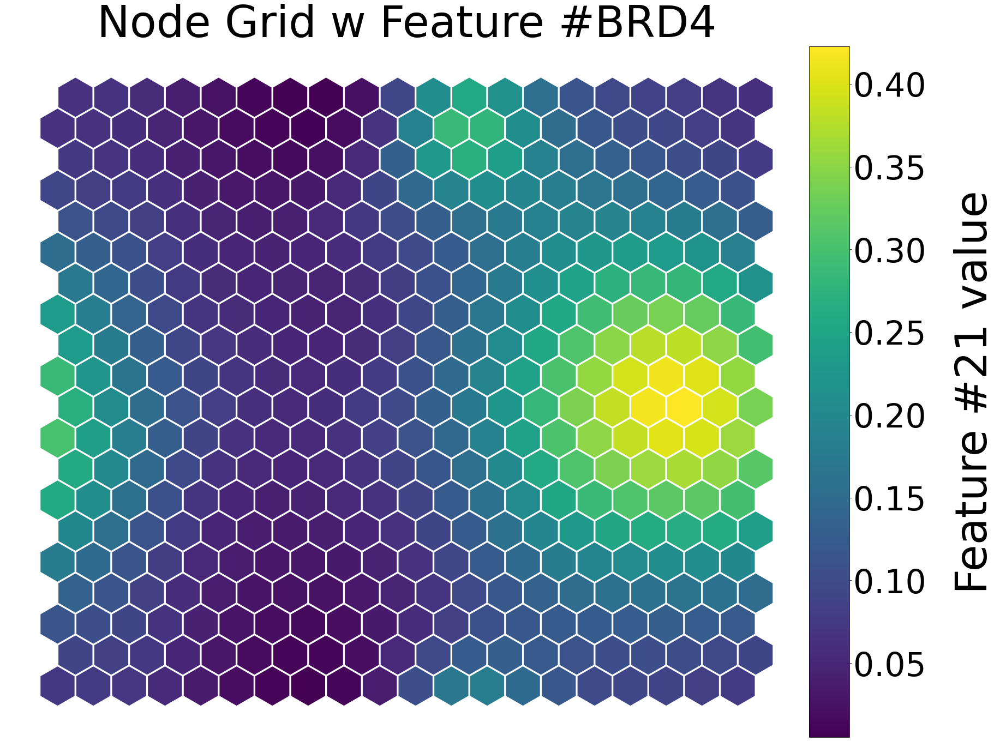

<Figure size 432x288 with 0 Axes>

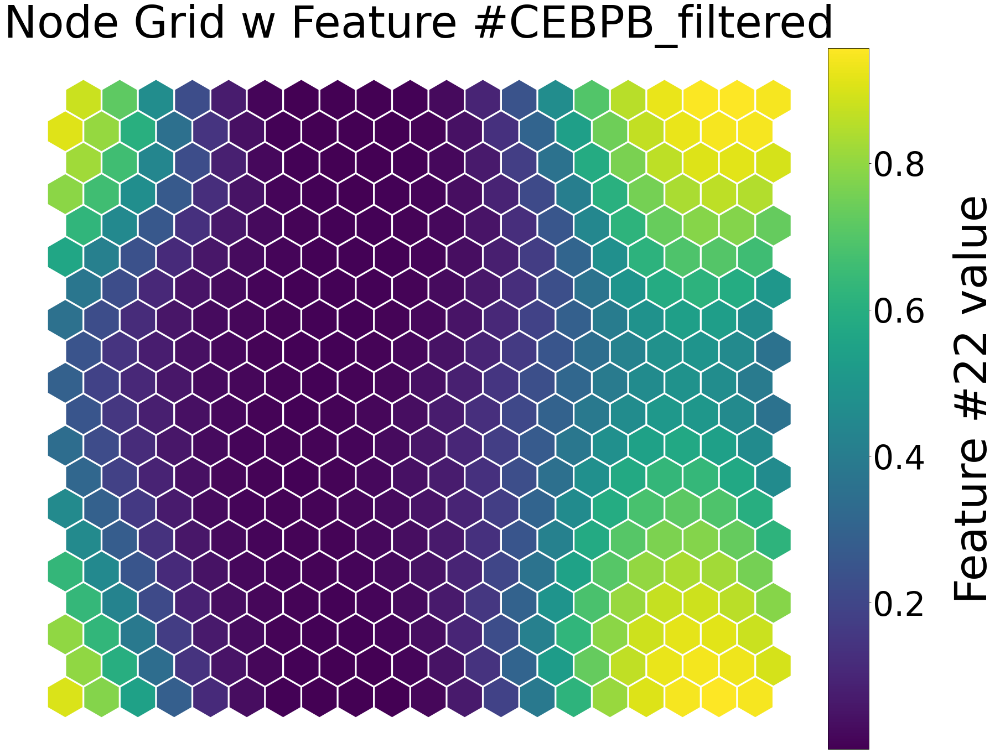

<Figure size 432x288 with 0 Axes>

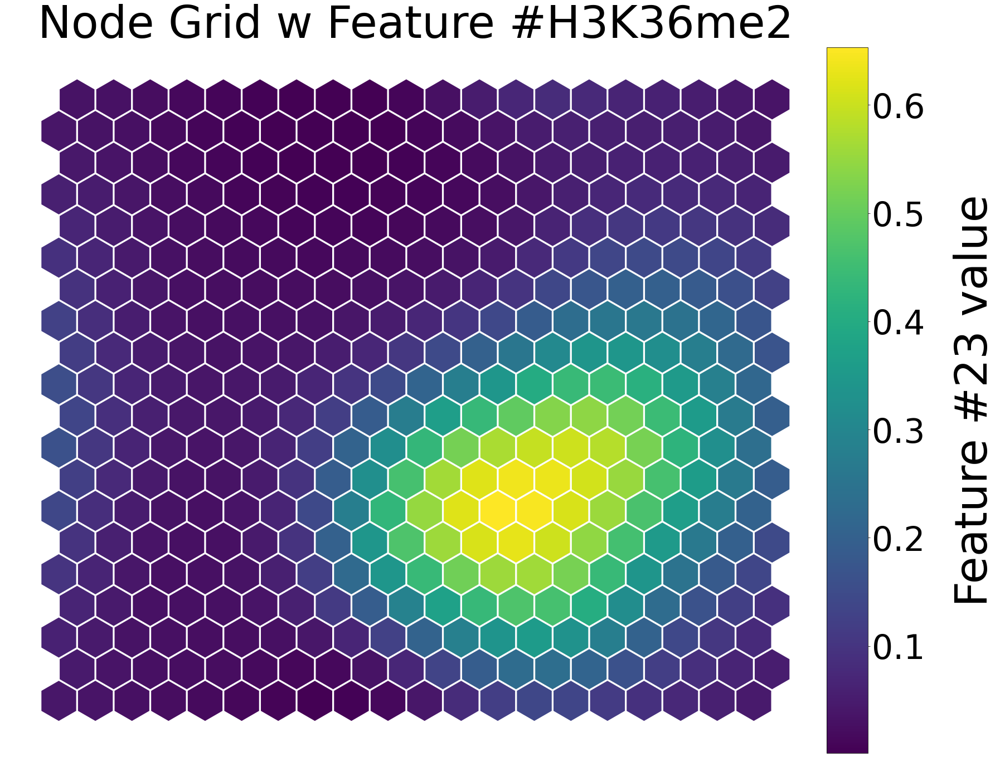

<Figure size 432x288 with 0 Axes>

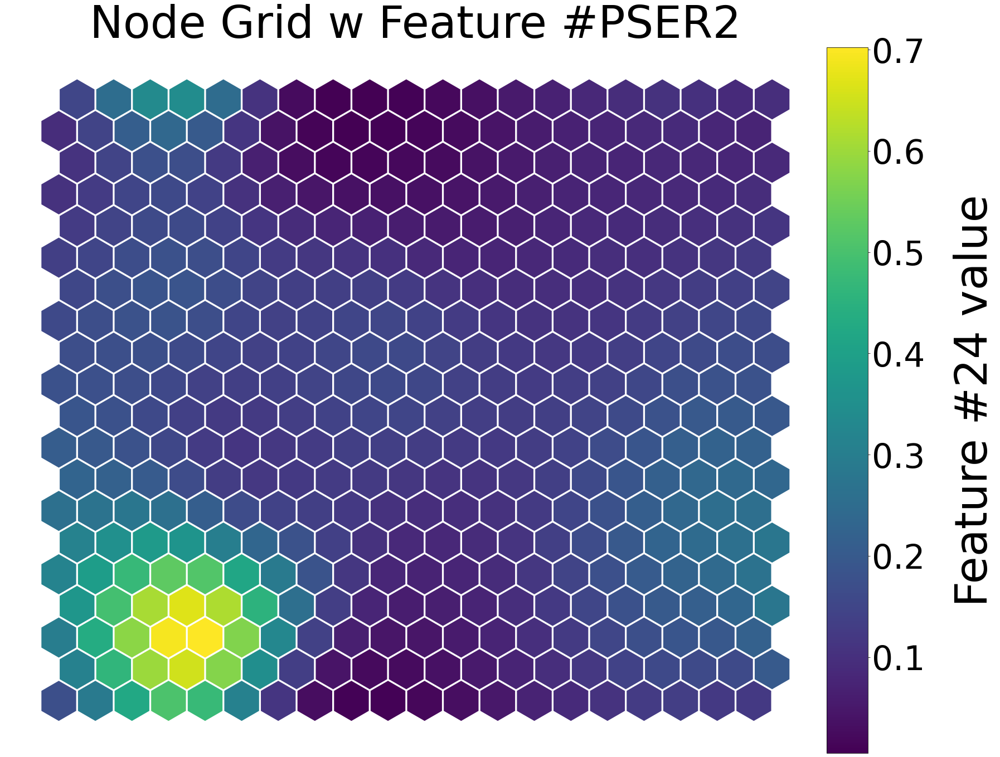

<Figure size 432x288 with 0 Axes>

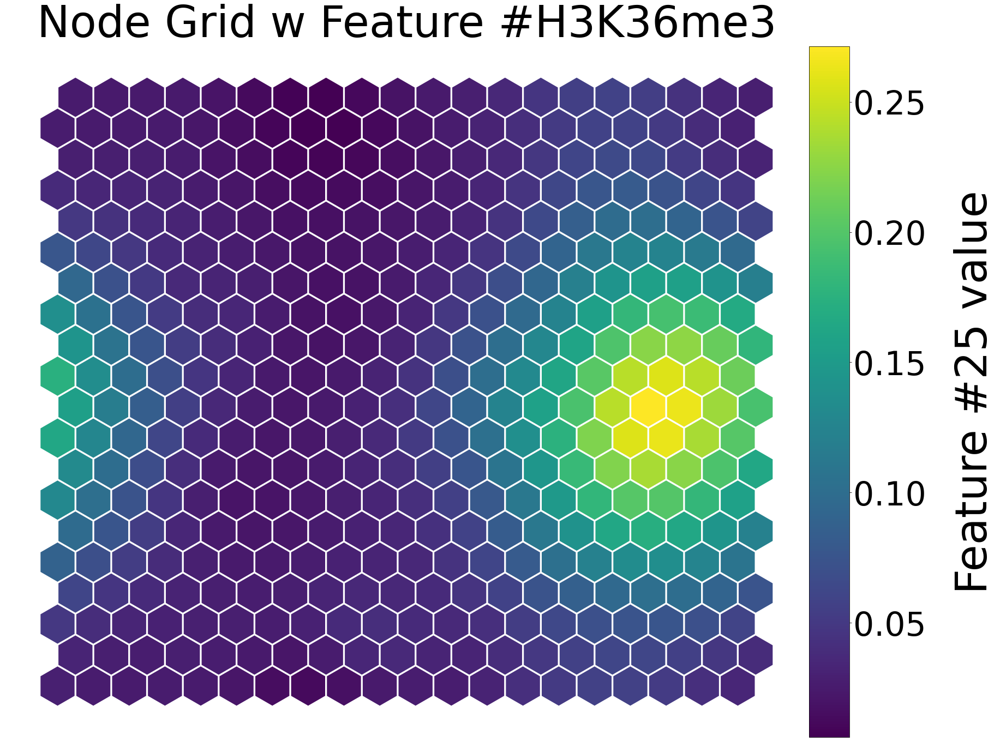

<Figure size 432x288 with 0 Axes>

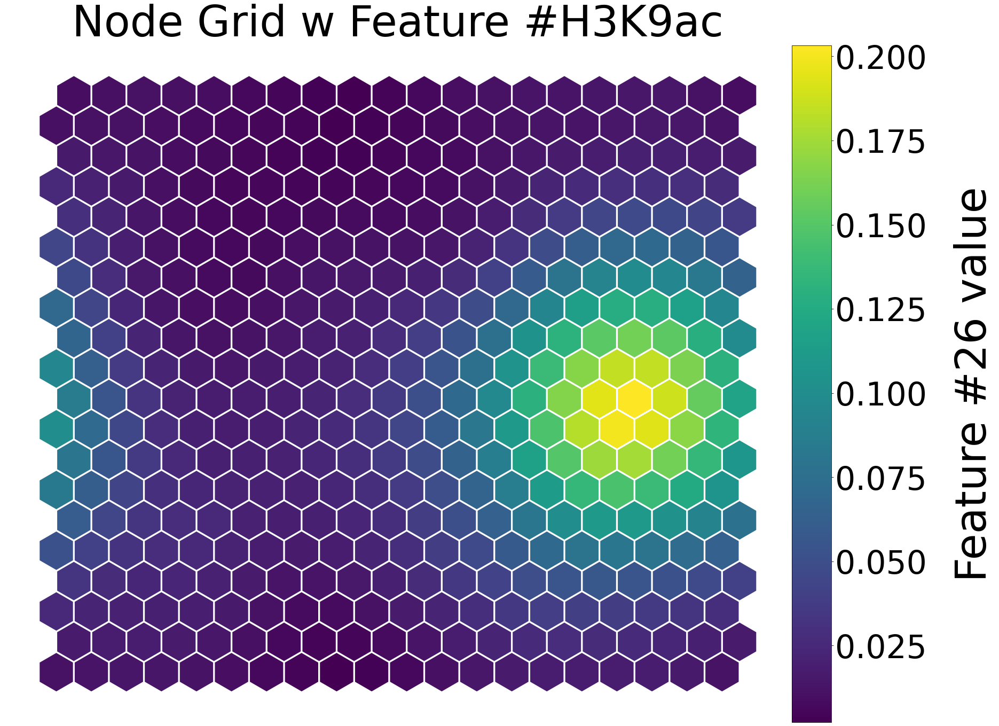

<Figure size 432x288 with 0 Axes>

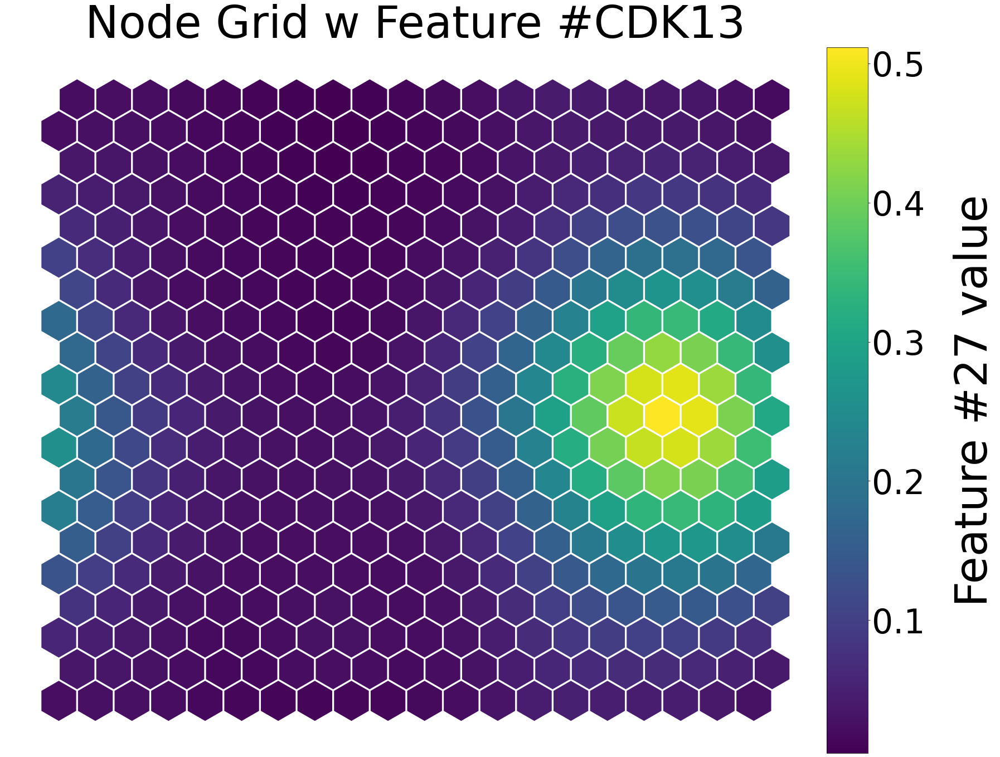

<Figure size 432x288 with 0 Axes>

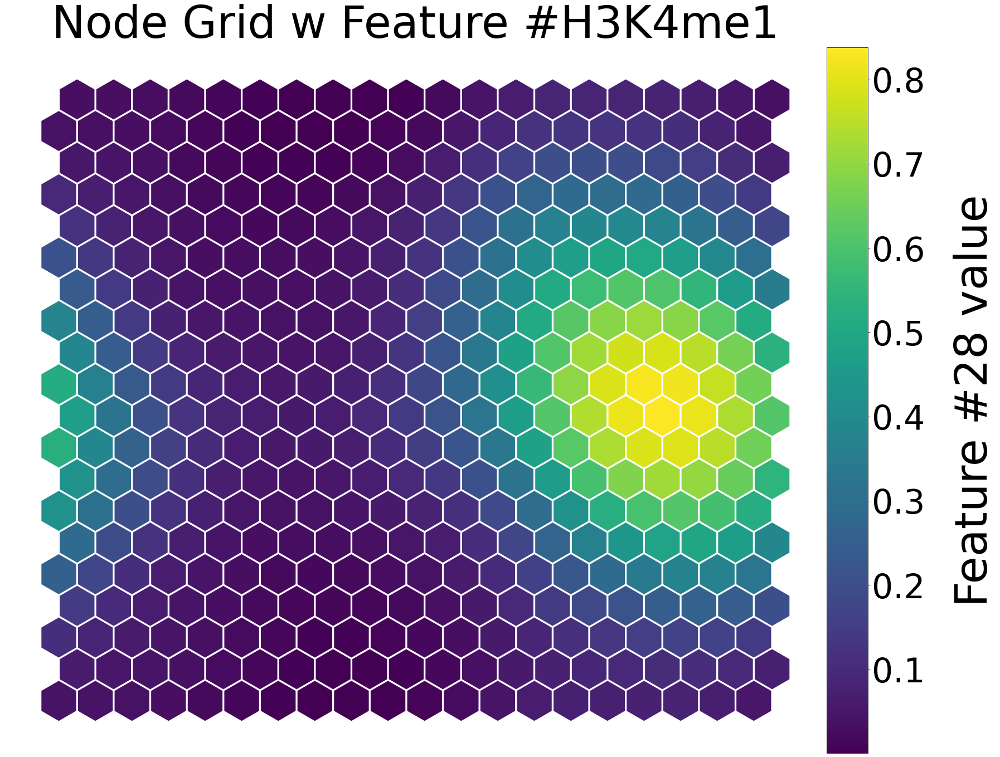

<Figure size 432x288 with 0 Axes>

In [142]:
#Print a map of the network nodes and colour them according to the first feature (column number 0) of the dataset
#and then according to the distance between each node and its neighbours.
for col in range(scaled_data.shape[1]):
    net.nodes_graph(colnum=col, printout=True, show=True, path="../results/"+project+'/plots/'+version+'_'+merging_version+'_'+window+"_somNets/", colname=data.columns[col])

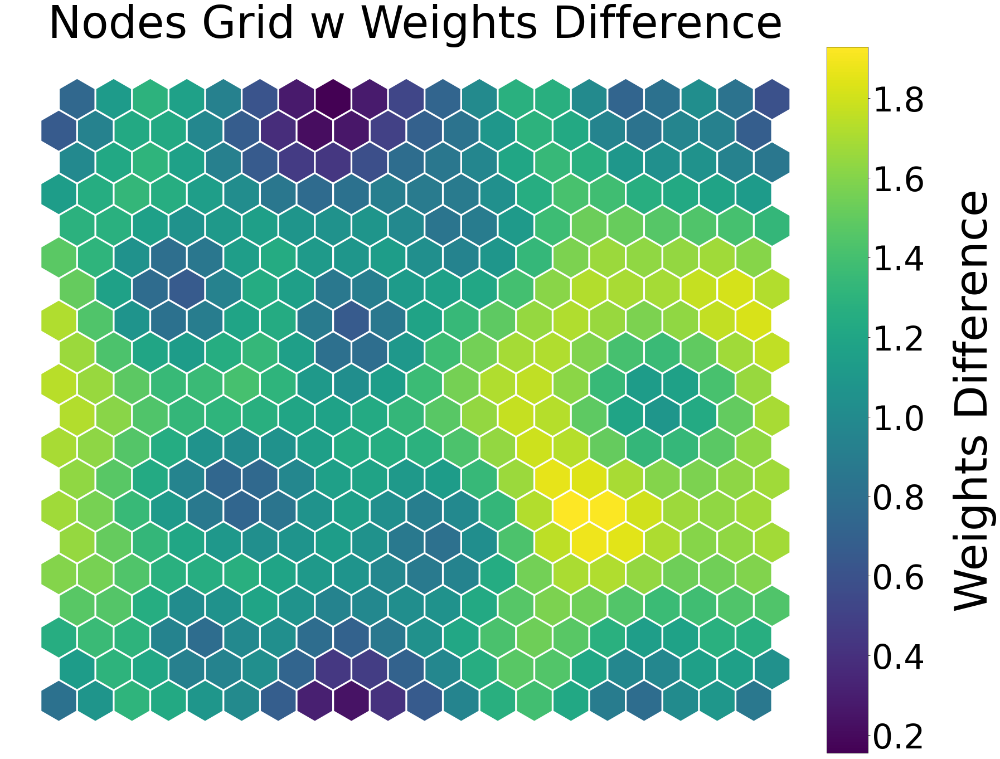

In [143]:
diffs = net.diff_graph(show=False, returns=True)
plt.savefig('../results/'+project+'/plots/'+version+'_'+merging_version+'_'+window+'_cobinding_SOM_'+str(size)+'.pdf')

RuntimeError: Models must be owned by only a single document, HexTile(id='2719', ...) is already in a doc

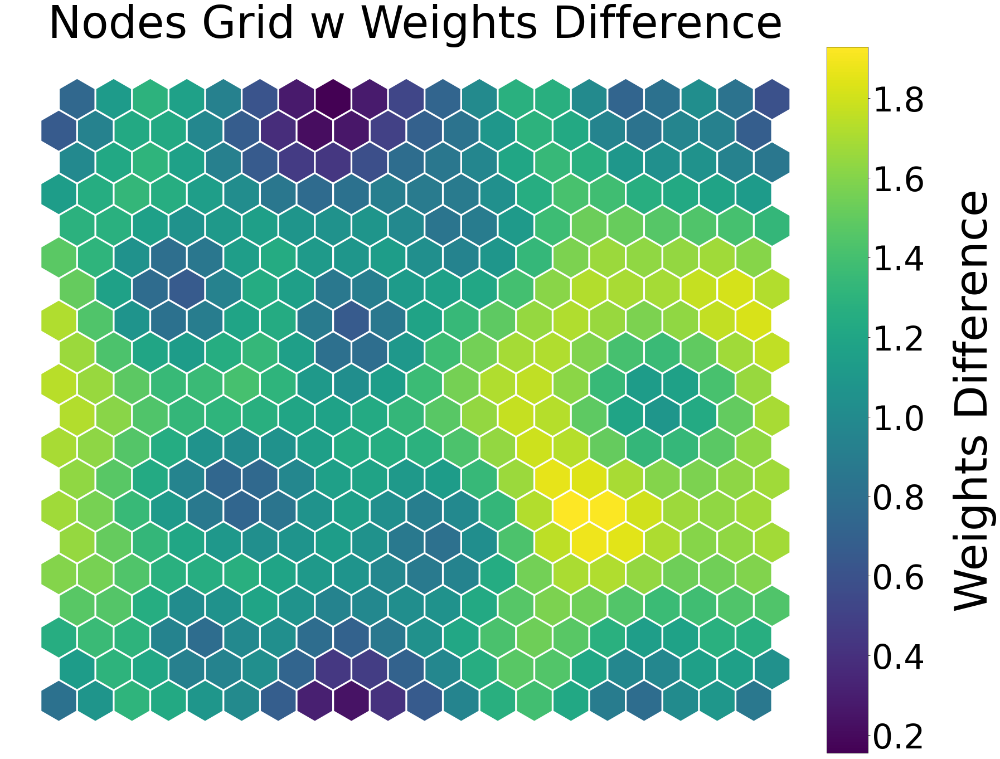

In [147]:
plot.SOMPlot(net, size=size, colnames=merged.columns[cols:annot], folder='../results/' + project + '/plots/' + version + '_' + merging_version + '_'+window+"_onbool", minweight=0.3)

In [148]:
#Cluster the datapoints according to the Quality Threshold algorithm.
clusts = net.cluster(scaled_data, type='KMeans',numcl=n_clust[n])
sorting  = []
for clust in clusts:
    sorting.extend(clust)
sorting = np.array(sorting)

<Figure size 432x288 with 0 Axes>

In [149]:
viridis = cm.get_cmap('gist_rainbow', len(clusts))
colors=[]
for i, clust in enumerate(clusts):
    colors.extend([viridis(i)]*len(clust))
colors = np.array(colors)
viridis = cm.get_cmap('viridis', 256)
data = merged[merged.columns[annot:]]
for val in data.columns:
    data[val] = np.log2(1+data[val])
data = (data-data.min())/(data.max()-data.min())
rand = np.random.choice(range(len(sorting)),5000)
rand.sort()
data = data.iloc[sorting[rand]]
for val in data.columns:
    a = [viridis(int(v*256)) for v in data[val]]
    data[val] = a
data["clusters"]  = [tuple(i) for i in colors[rand]]

<ipython-input-149-3d497b534963>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data[val] = np.log2(1+data[val])


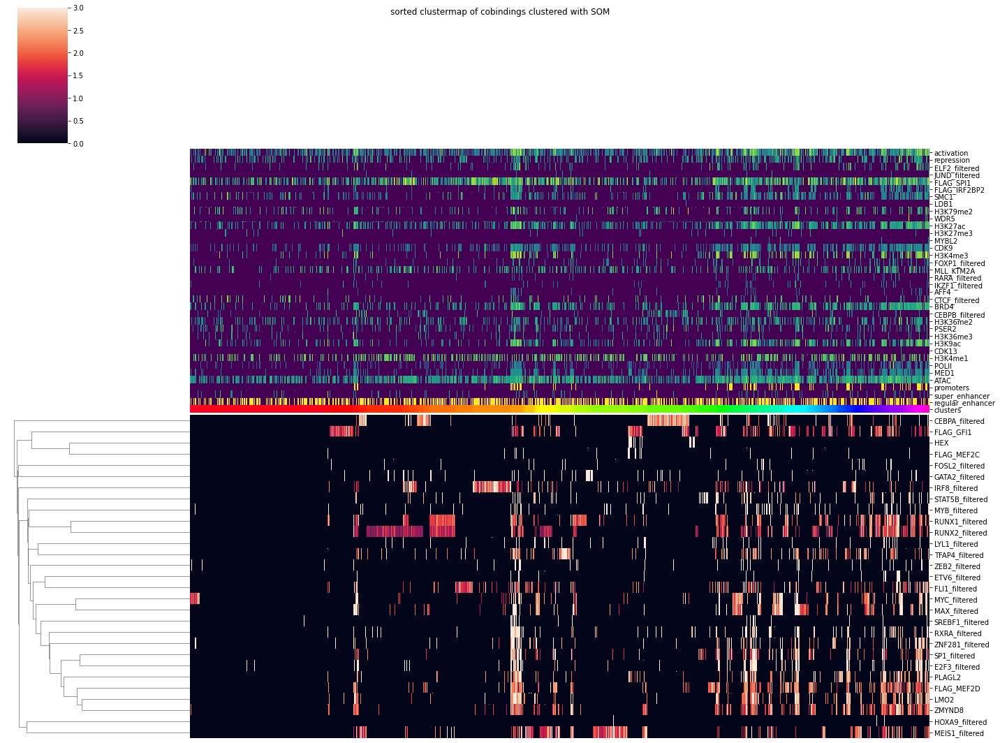

In [154]:
#sorted clustermap of cobindings clustered with SOM
fig = sns.clustermap(np.log2(1.01+merged[merged.columns[cols:annot]].iloc[sorting[rand]].T), vmin=0,vmax=3,figsize=(20,15),z_score=0, colors_ratio=0.01, col_cluster=False,col_colors=data, xticklabels=False)
fig.ax_col_dendrogram.set_visible(False)
fig.fig.suptitle("sorted clustermap of cobindings clustered with SOM")
fig.savefig('../results/'+project+'/plots/'+version+'_'+merging_version+'_'+window+'_SOM_'+str(n_clust)+'_onbool_clustermap_cobinding.pdf')
plt.show()

In [155]:
#let's look at the enrichment over SOM clusters
groups = []
for i, val in enumerate(clusts):
    groups.extend([i]*len(val))
enr, pvals, _ = chip.enrichment(merged, groups = np.array(groups))

../../JKBio/epigenetics/chipseq.py:1168: RuntimeWarning: divide by zero encountered in log2
  groups), columns=bedfile.columns[bedcol:])


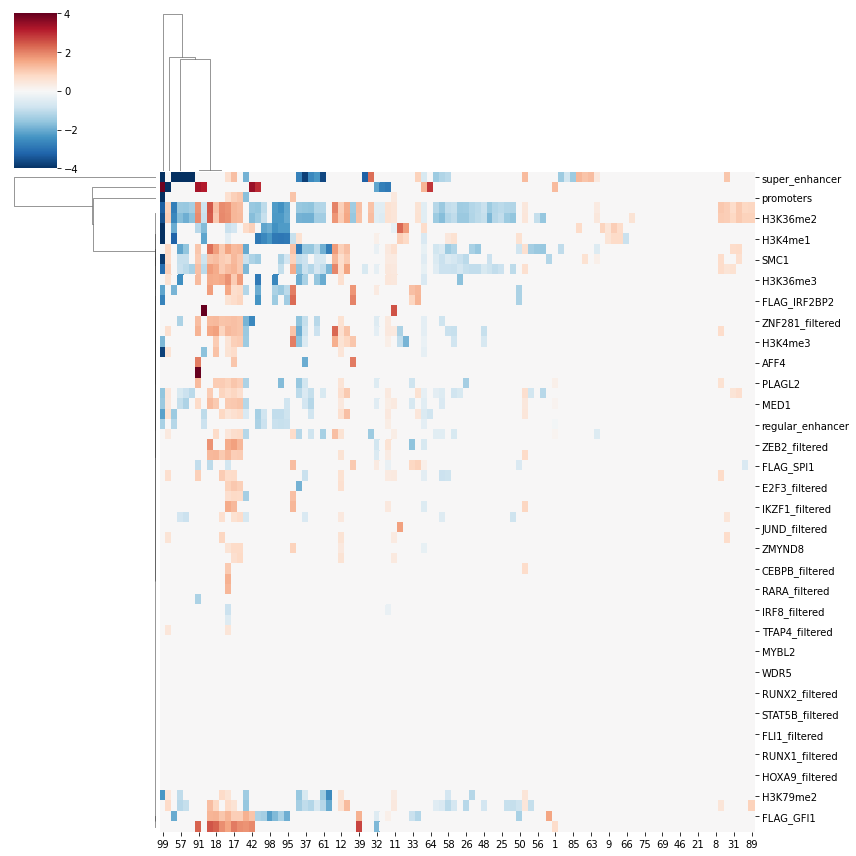

In [156]:
fig = sns.clustermap(enr.T,figsize=(12,12), vmax=4, vmin=-4, cmap='RdBu_r')
fig.savefig('../results/'+project+'/plots/'+version+'_'+merging_version+'_'+window+'_kmeans_'+str(n_clust[n])+'_bool_enrichment_on_SOMcluster_metasubset.pdf')
plt.show()

## Plot TSNE density map

In [159]:
rand = np.random.choice(merged.index,30000)

In [ ]:
red_data = TSNE(2,600,verbose=10,n_iter=1500).fit_transform(scaled_data[rand])
np.save('../results/'+project+'/'+version+'_'+merging_version+'_'+window+'red_data_on_bool.npy',red_data)

[t-SNE] Computing 1801 nearest neighbors...
[t-SNE] Indexed 30000 samples in 1.545s...
[t-SNE] Computed neighbors for 30000 samples in 94.767s...
[t-SNE] Computed conditional probabilities for sample 1000 / 30000
[t-SNE] Computed conditional probabilities for sample 2000 / 30000
[t-SNE] Computed conditional probabilities for sample 3000 / 30000
[t-SNE] Computed conditional probabilities for sample 4000 / 30000
[t-SNE] Computed conditional probabilities for sample 5000 / 30000
[t-SNE] Computed conditional probabilities for sample 6000 / 30000
[t-SNE] Computed conditional probabilities for sample 7000 / 30000
[t-SNE] Computed conditional probabilities for sample 8000 / 30000
[t-SNE] Computed conditional probabilities for sample 9000 / 30000
[t-SNE] Computed conditional probabilities for sample 10000 / 30000
[t-SNE] Computed conditional probabilities for sample 11000 / 30000
[t-SNE] Computed conditional probabilities for sample 12000 / 30000
[t-SNE] Computed conditional probabilities for 

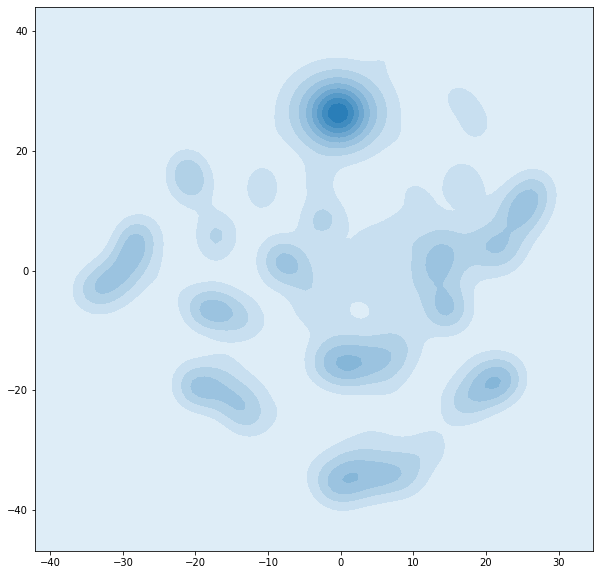

In [125]:
# Let's look at the data. the density map of the distribution of all pseudo enhancer over their tf binding profile
_, ax = plt.subplots(figsize=(10,10))
fig = sns.kdeplot(red_data[:,0], red_data[:,1], shade=True, ax=ax)
plt.savefig('../results/'+project+'/plots/'+version+'_'+merging_version+'_'+window+'_density_TSNE.pdf')

In [162]:
# now let's look at it from anothe rploting method. we can see many many islands
plot.bigScatter(red_data,binsize=0.4,showpoint=False,precomputed=False, logscale=True, title='density plot of enhancers in TF cobinding space with TSNE', folder='../results/'+project+'/plots/'+version+'_'+merging_version+'_'+window+"_bool_")

Figure(id='3358', ...)

In [ ]:
## TODO: color by feature

## TODO: color by dependencies/pathways/expression.. after ABC model,